# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

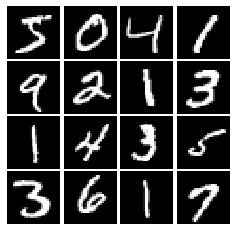

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    out = np.copy(x)
    out[out<0] *= alpha
    
    return out

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [7]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('y_true ' + str(y_true))
    print('y_got ' + str(y))
    print()
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

y_true [[ 0.46831836 -0.0025901  -0.00299659]
 [ 0.9153279   1.01321313  1.64436032]]
y_got [[ 0.46831836 -0.0025901  -0.00299659]
 [ 0.9153279   1.01321313  1.64436032]]

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [8]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    initializer = tf.random_uniform_initializer(-1,1)
    imgs = initializer(shape=(batch_size, dim))
    
    return imgs

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [9]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [10]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,), use_bias=True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256, use_bias=True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1, use_bias=True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [11]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [12]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024, use_bias=True),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784, activation='tanh', use_bias=True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [13]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [53]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    cross_entrophy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    real_loss = cross_entrophy(tf.ones_like(logits_real), logits_real)
    generated_loss = cross_entrophy(tf.zeros_like(logits_fake), logits_fake)

    loss = real_loss + generated_loss


    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entrophy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entrophy(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [52]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("d_loss_true " + str(answers['d_loss_true']))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

W0719 10:23:45.626396  7432 deprecation.py:323] From C:\Users\Sony\Anaconda3\envs\cs231n\lib\site-packages\tensorflow\python\ops\nn_impl.py:182: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


d_loss_true 1.8423983904443109
Maximum error in d_loss: 3.97058e-09


In [54]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [59]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """

    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [81]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.631, G:0.7041


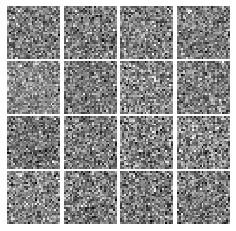

Epoch: 0, Iter: 20, D: 0.6246, G:0.8596


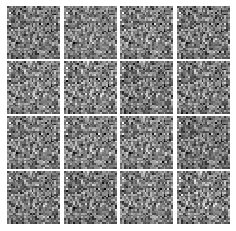

Epoch: 0, Iter: 40, D: 0.464, G:1.072


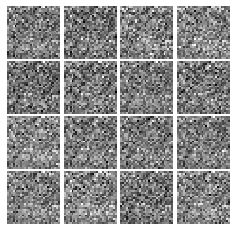

Epoch: 0, Iter: 60, D: 3.287, G:3.664


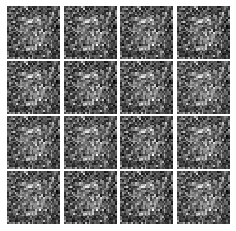

Epoch: 0, Iter: 80, D: 0.969, G:1.545


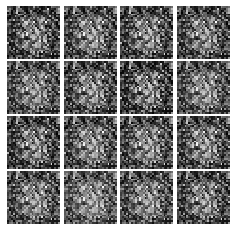

Epoch: 0, Iter: 100, D: 1.318, G:1.011


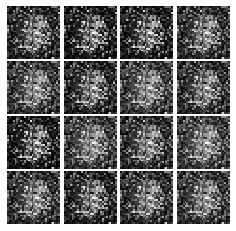

Epoch: 0, Iter: 120, D: 1.258, G:1.471


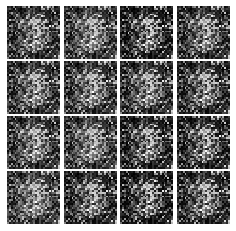

Epoch: 0, Iter: 140, D: 1.219, G:1.416


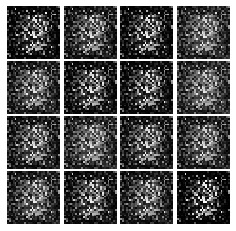

Epoch: 0, Iter: 160, D: 1.054, G:1.39


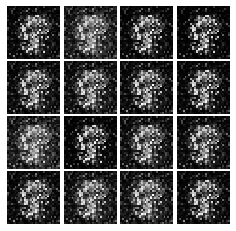

Epoch: 0, Iter: 180, D: 1.824, G:0.4924


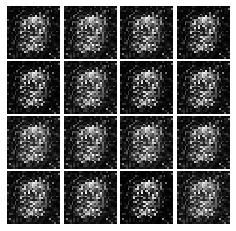

Epoch: 0, Iter: 200, D: 1.143, G:1.599


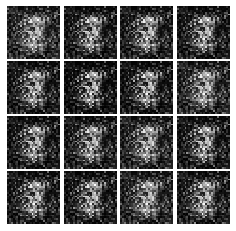

Epoch: 0, Iter: 220, D: 1.39, G:0.9814


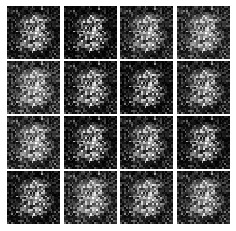

Epoch: 0, Iter: 240, D: 0.9004, G:2.038


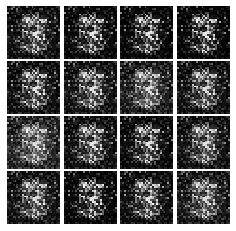

Epoch: 0, Iter: 260, D: 0.8215, G:2.028


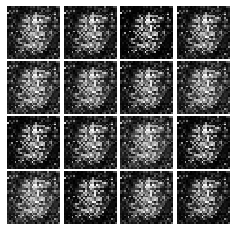

Epoch: 0, Iter: 280, D: 1.182, G:1.087


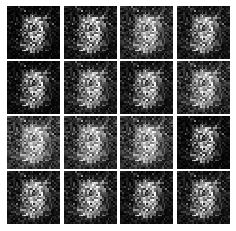

Epoch: 0, Iter: 300, D: 1.512, G:1.206


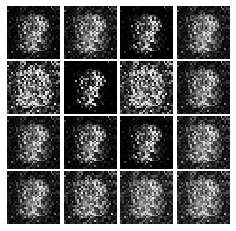

Epoch: 0, Iter: 320, D: 1.448, G:1.091


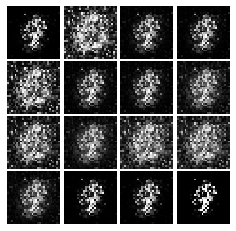

Epoch: 0, Iter: 340, D: 1.056, G:2.55


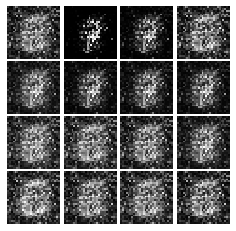

Epoch: 0, Iter: 360, D: 1.067, G:1.291


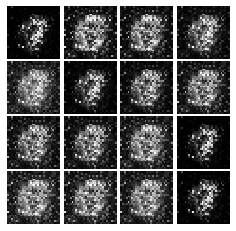

Epoch: 0, Iter: 380, D: 1.14, G:1.683


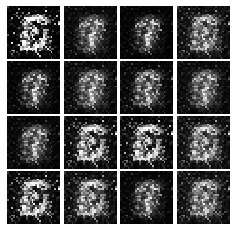

Epoch: 0, Iter: 400, D: 1.148, G:1.141


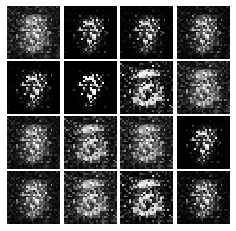

Epoch: 0, Iter: 420, D: 1.065, G:1.459


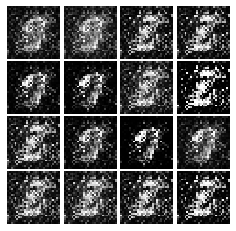

Epoch: 0, Iter: 440, D: 1.477, G:3.242


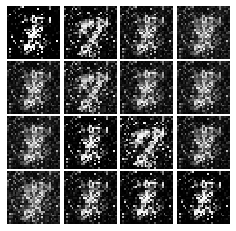

Epoch: 0, Iter: 460, D: 1.471, G:3.092


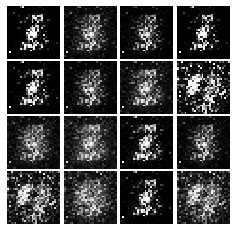

Epoch: 1, Iter: 480, D: 1.353, G:1.113


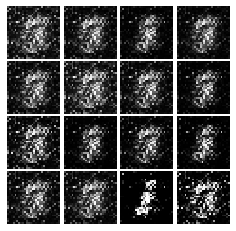

Epoch: 1, Iter: 500, D: 0.988, G:1.108


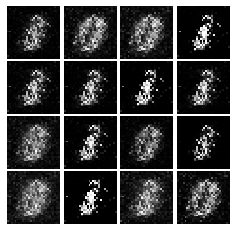

Epoch: 1, Iter: 520, D: 0.8987, G:1.557


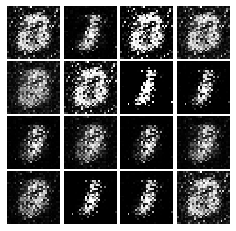

Epoch: 1, Iter: 540, D: 1.622, G:1.493


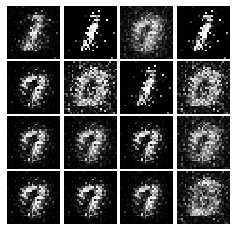

Epoch: 1, Iter: 560, D: 1.085, G:1.056


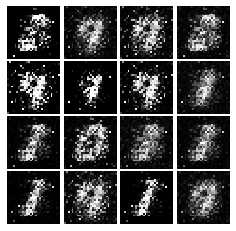

Epoch: 1, Iter: 580, D: 1.105, G:2.211


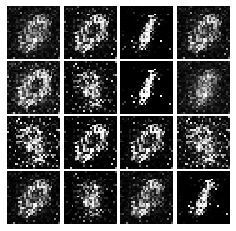

Epoch: 1, Iter: 600, D: 1.341, G:1.071


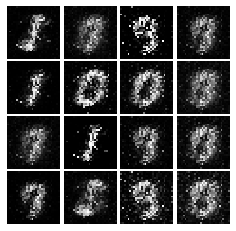

Epoch: 1, Iter: 620, D: 1.149, G:1.153


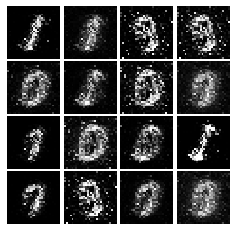

Epoch: 1, Iter: 640, D: 1.04, G:1.327


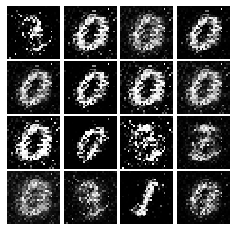

Epoch: 1, Iter: 660, D: 1.184, G:2.058


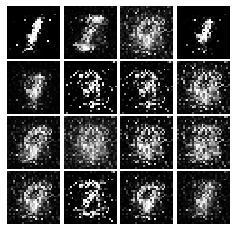

Epoch: 1, Iter: 680, D: 1.157, G:1.134


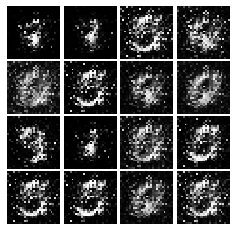

Epoch: 1, Iter: 700, D: 1.174, G:1.267


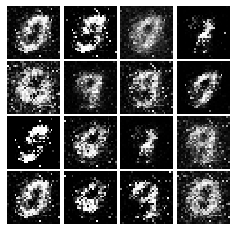

Epoch: 1, Iter: 720, D: 1.152, G:1.278


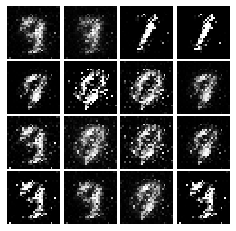

Epoch: 1, Iter: 740, D: 1.329, G:1.188


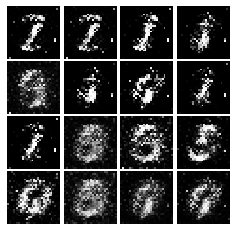

Epoch: 1, Iter: 760, D: 1.771, G:0.2657


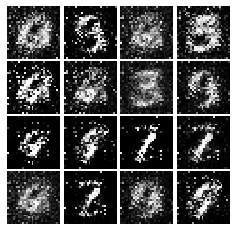

Epoch: 1, Iter: 780, D: 1.355, G:1.411


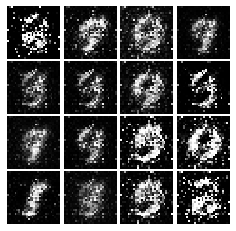

Epoch: 1, Iter: 800, D: 1.231, G:1.093


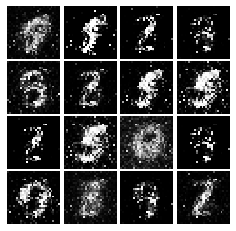

Epoch: 1, Iter: 820, D: 1.467, G:1.709


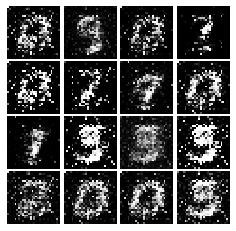

Epoch: 1, Iter: 840, D: 1.352, G:1.198


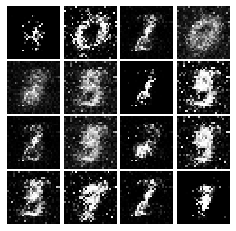

Epoch: 1, Iter: 860, D: 1.033, G:1.128


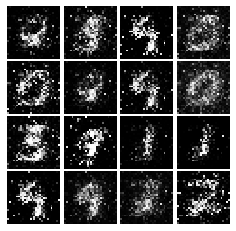

Epoch: 1, Iter: 880, D: 1.208, G:2.006


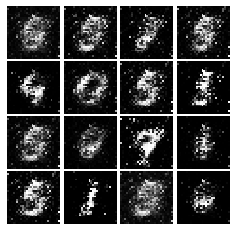

Epoch: 1, Iter: 900, D: 1.032, G:1.581


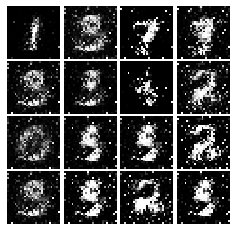

Epoch: 1, Iter: 920, D: 1.159, G:1.387


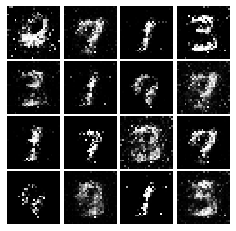

Epoch: 2, Iter: 940, D: 1.016, G:1.21


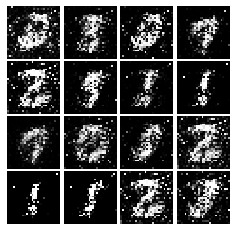

Epoch: 2, Iter: 960, D: 1.608, G:0.5524


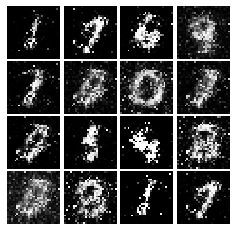

Epoch: 2, Iter: 980, D: 1.06, G:1.202


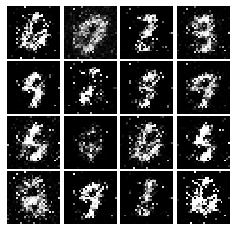

Epoch: 2, Iter: 1000, D: 1.18, G:0.9947


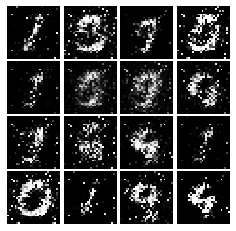

Epoch: 2, Iter: 1020, D: 1.348, G:1.857


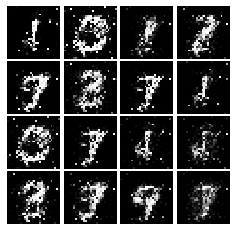

Epoch: 2, Iter: 1040, D: 0.9246, G:0.8388


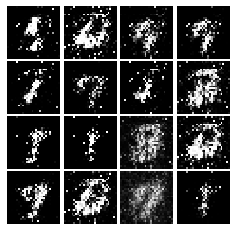

Epoch: 2, Iter: 1060, D: 1.131, G:1.133


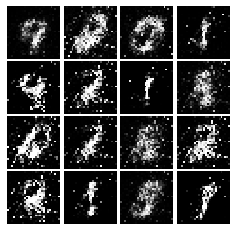

Epoch: 2, Iter: 1080, D: 1.222, G:0.9193


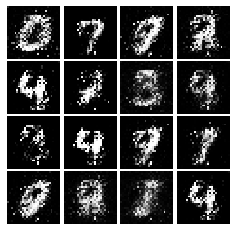

Epoch: 2, Iter: 1100, D: 1.155, G:1.225


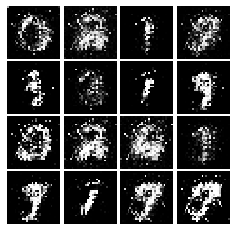

Epoch: 2, Iter: 1120, D: 1.182, G:1.392


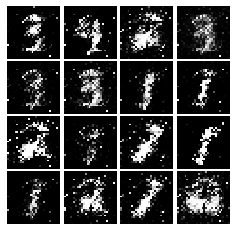

Epoch: 2, Iter: 1140, D: 1.418, G:0.4867


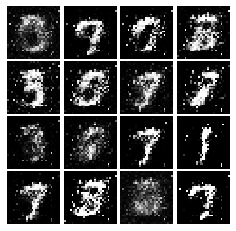

Epoch: 2, Iter: 1160, D: 1.065, G:1.006


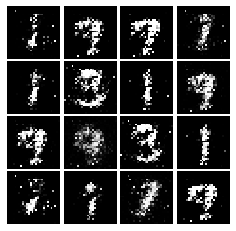

Epoch: 2, Iter: 1180, D: 1.133, G:1.229


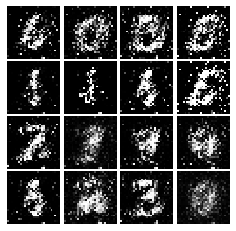

Epoch: 2, Iter: 1200, D: 1.329, G:1.371


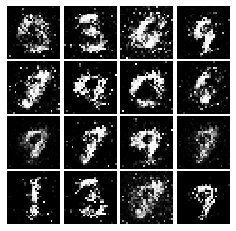

Epoch: 2, Iter: 1220, D: 1.161, G:1.568


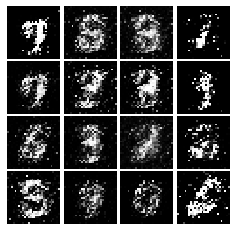

Epoch: 2, Iter: 1240, D: 1.121, G:1.101


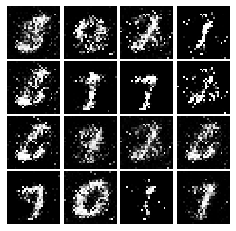

Epoch: 2, Iter: 1260, D: 1.269, G:0.7571


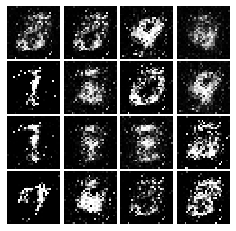

Epoch: 2, Iter: 1280, D: 1.327, G:1.057


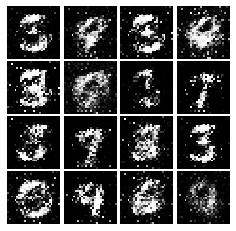

Epoch: 2, Iter: 1300, D: 1.292, G:0.9062


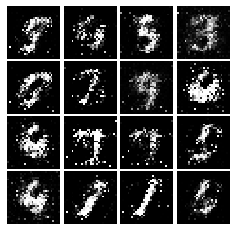

Epoch: 2, Iter: 1320, D: 1.203, G:1.22


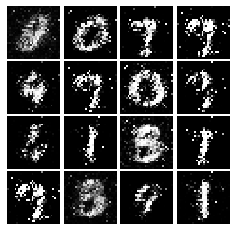

Epoch: 2, Iter: 1340, D: 1.378, G:0.7137


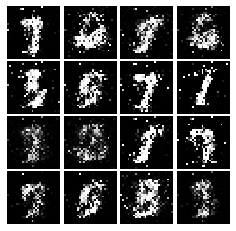

Epoch: 2, Iter: 1360, D: 1.283, G:0.9655


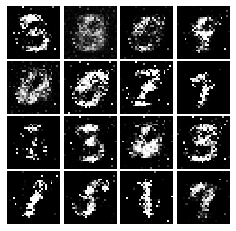

Epoch: 2, Iter: 1380, D: 1.385, G:1.018


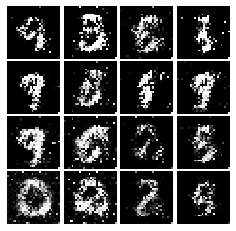

Epoch: 2, Iter: 1400, D: 1.429, G:1.048


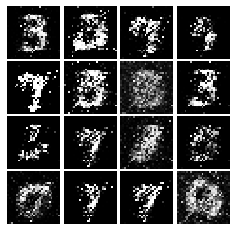

Epoch: 3, Iter: 1420, D: 1.234, G:0.4232


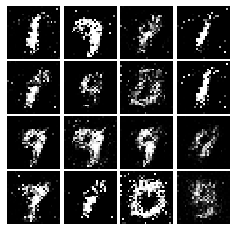

Epoch: 3, Iter: 1440, D: 1.344, G:0.8943


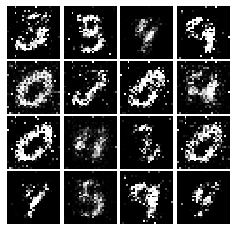

Epoch: 3, Iter: 1460, D: 1.275, G:1.042


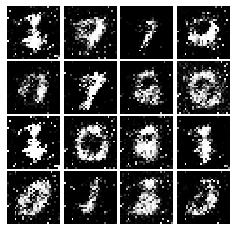

Epoch: 3, Iter: 1480, D: 1.355, G:0.7972


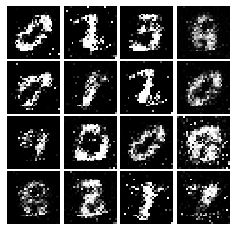

Epoch: 3, Iter: 1500, D: 1.264, G:1.069


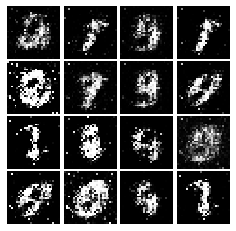

Epoch: 3, Iter: 1520, D: 1.274, G:1.012


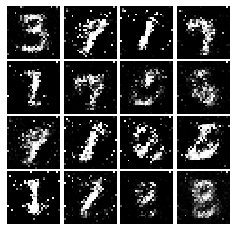

Epoch: 3, Iter: 1540, D: 1.495, G:0.7725


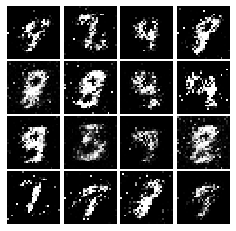

Epoch: 3, Iter: 1560, D: 1.314, G:1.128


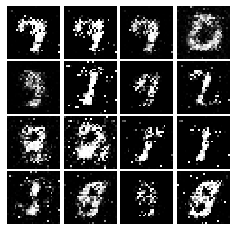

Epoch: 3, Iter: 1580, D: 1.197, G:0.9437


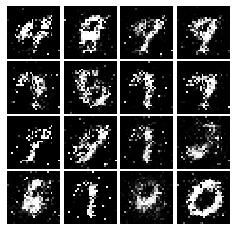

Epoch: 3, Iter: 1600, D: 1.329, G:0.9496


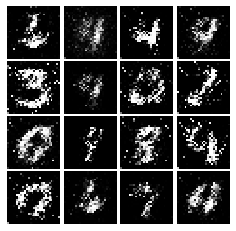

Epoch: 3, Iter: 1620, D: 1.089, G:1.179


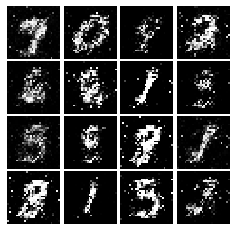

Epoch: 3, Iter: 1640, D: 1.261, G:0.878


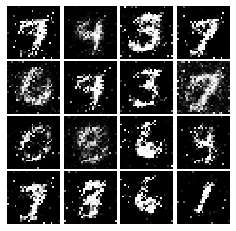

Epoch: 3, Iter: 1660, D: 1.114, G:1.388


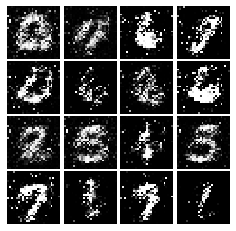

Epoch: 3, Iter: 1680, D: 1.175, G:1.187


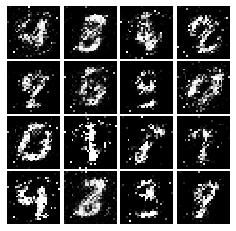

Epoch: 3, Iter: 1700, D: 1.36, G:0.976


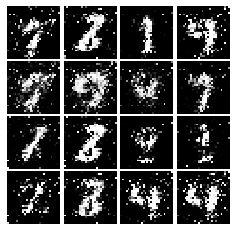

Epoch: 3, Iter: 1720, D: 1.332, G:1.045


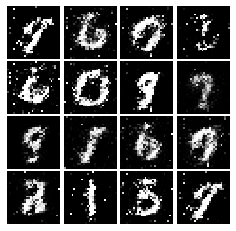

Epoch: 3, Iter: 1740, D: 1.236, G:1.015


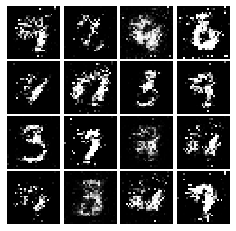

Epoch: 3, Iter: 1760, D: 1.226, G:0.9057


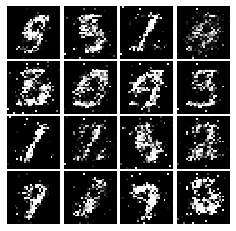

Epoch: 3, Iter: 1780, D: 1.247, G:0.8524


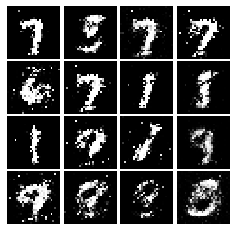

Epoch: 3, Iter: 1800, D: 1.244, G:0.9507


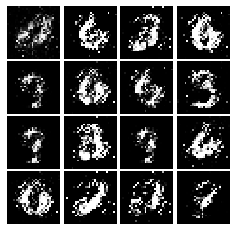

Epoch: 3, Iter: 1820, D: 1.273, G:0.8441


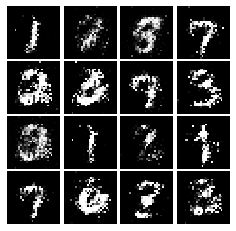

Epoch: 3, Iter: 1840, D: 1.32, G:0.7885


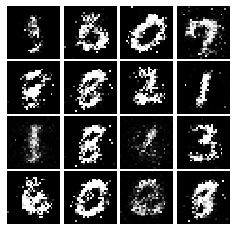

Epoch: 3, Iter: 1860, D: 1.365, G:0.8186


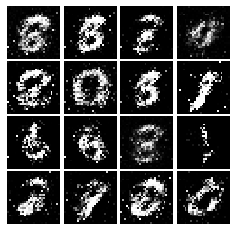

Epoch: 4, Iter: 1880, D: 1.218, G:1.2


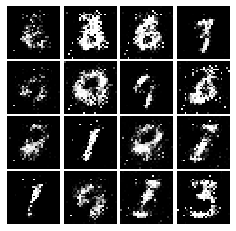

Epoch: 4, Iter: 1900, D: 1.332, G:0.9152


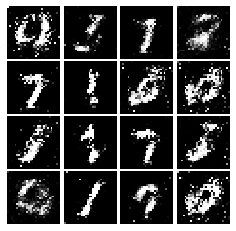

Epoch: 4, Iter: 1920, D: 1.225, G:0.8702


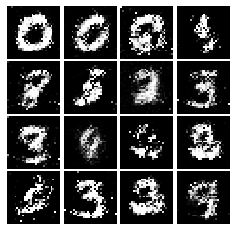

Epoch: 4, Iter: 1940, D: 1.067, G:1.379


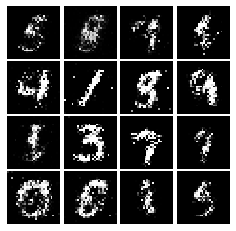

Epoch: 4, Iter: 1960, D: 1.198, G:0.9894


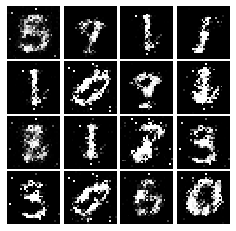

Epoch: 4, Iter: 1980, D: 1.29, G:0.8795


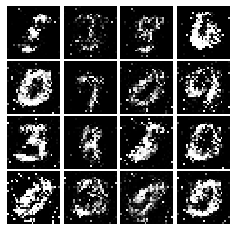

Epoch: 4, Iter: 2000, D: 1.354, G:0.8249


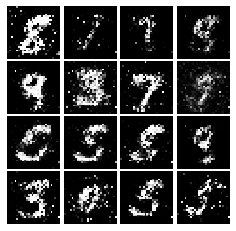

Epoch: 4, Iter: 2020, D: 2.248, G:1.22


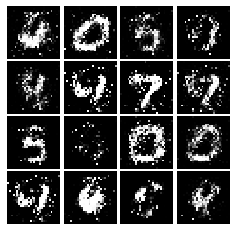

Epoch: 4, Iter: 2040, D: 1.27, G:0.925


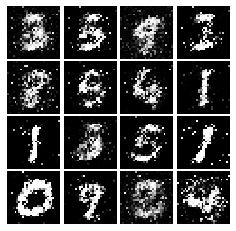

Epoch: 4, Iter: 2060, D: 1.222, G:1.476


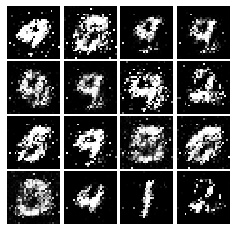

Epoch: 4, Iter: 2080, D: 1.359, G:0.86


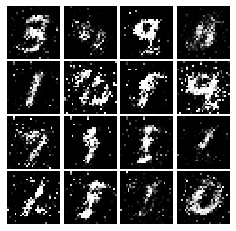

Epoch: 4, Iter: 2100, D: 1.347, G:0.6704


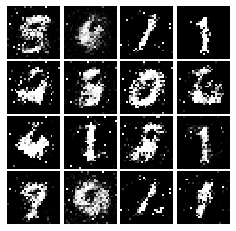

Epoch: 4, Iter: 2120, D: 1.26, G:0.9376


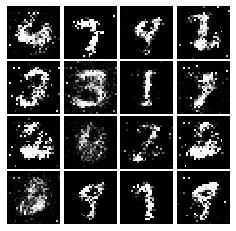

Epoch: 4, Iter: 2140, D: 1.338, G:0.8594


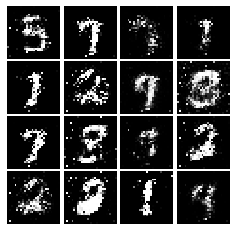

Epoch: 4, Iter: 2160, D: 1.373, G:0.8509


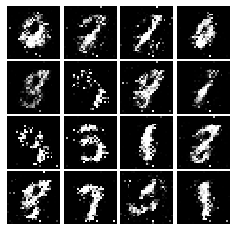

Epoch: 4, Iter: 2180, D: 1.29, G:1.062


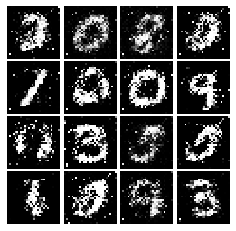

Epoch: 4, Iter: 2200, D: 1.152, G:1.252


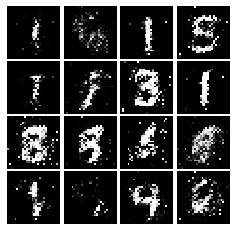

Epoch: 4, Iter: 2220, D: 1.172, G:1.195


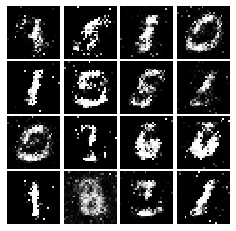

Epoch: 4, Iter: 2240, D: 1.254, G:1.343


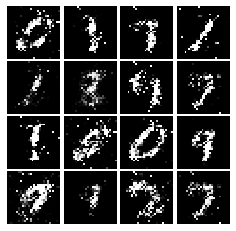

Epoch: 4, Iter: 2260, D: 1.4, G:0.8598


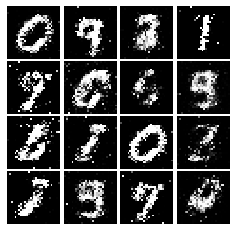

Epoch: 4, Iter: 2280, D: 1.212, G:0.9831


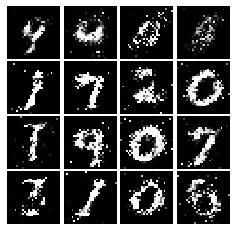

Epoch: 4, Iter: 2300, D: 1.162, G:0.8962


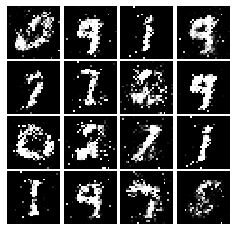

Epoch: 4, Iter: 2320, D: 1.208, G:0.8579


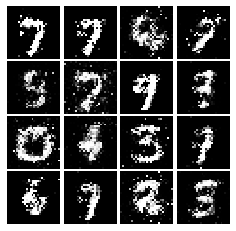

Epoch: 4, Iter: 2340, D: 1.412, G:0.2149


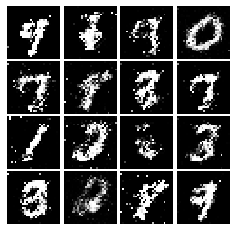

Epoch: 5, Iter: 2360, D: 1.319, G:0.8048


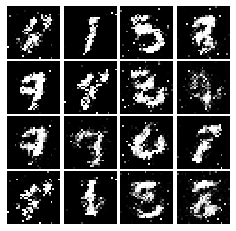

Epoch: 5, Iter: 2380, D: 1.316, G:1.775


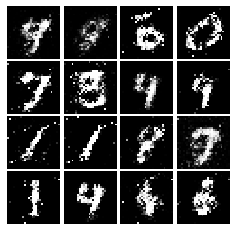

Epoch: 5, Iter: 2400, D: 1.263, G:0.9323


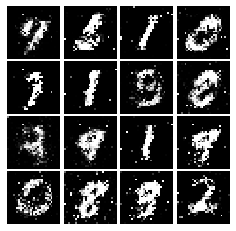

Epoch: 5, Iter: 2420, D: 1.368, G:0.9104


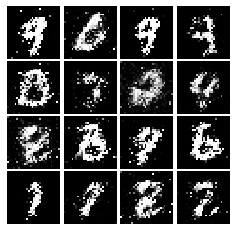

Epoch: 5, Iter: 2440, D: 1.342, G:0.814


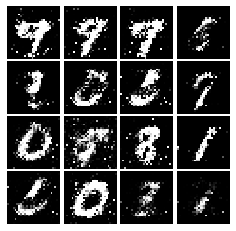

Epoch: 5, Iter: 2460, D: 1.255, G:0.6749


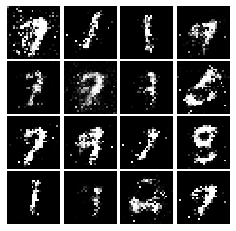

Epoch: 5, Iter: 2480, D: 1.273, G:0.8701


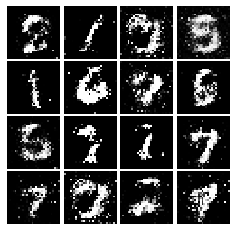

Epoch: 5, Iter: 2500, D: 1.238, G:0.7906


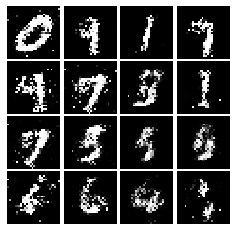

Epoch: 5, Iter: 2520, D: 1.43, G:0.7136


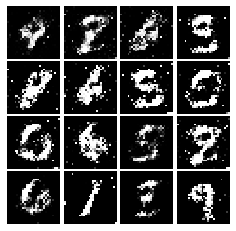

Epoch: 5, Iter: 2540, D: 1.331, G:0.7557


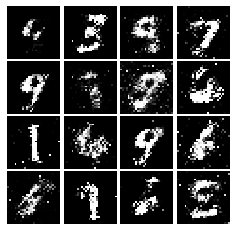

Epoch: 5, Iter: 2560, D: 1.273, G:0.8056


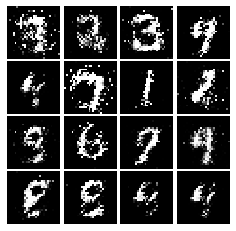

Epoch: 5, Iter: 2580, D: 1.333, G:0.8803


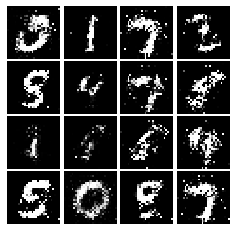

Epoch: 5, Iter: 2600, D: 1.485, G:0.6611


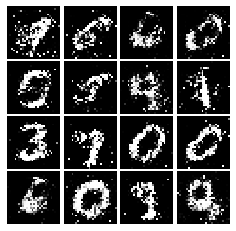

Epoch: 5, Iter: 2620, D: 1.305, G:0.9355


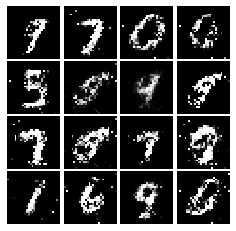

Epoch: 5, Iter: 2640, D: 1.313, G:0.8075


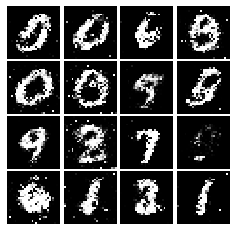

Epoch: 5, Iter: 2660, D: 1.29, G:0.8192


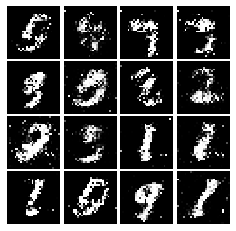

Epoch: 5, Iter: 2680, D: 1.354, G:1.007


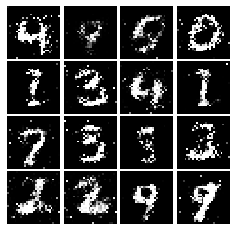

Epoch: 5, Iter: 2700, D: 1.422, G:0.8836


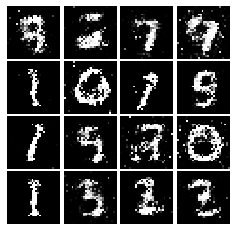

Epoch: 5, Iter: 2720, D: 1.325, G:0.8233


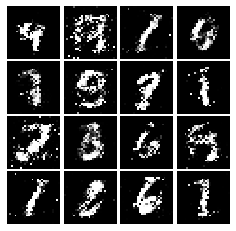

Epoch: 5, Iter: 2740, D: 1.266, G:0.8413


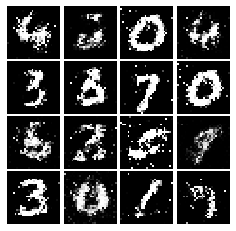

Epoch: 5, Iter: 2760, D: 1.271, G:0.9153


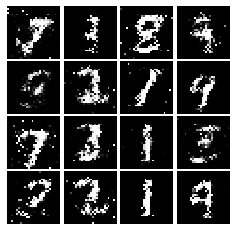

Epoch: 5, Iter: 2780, D: 1.288, G:0.8647


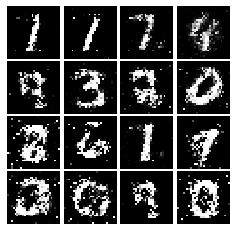

Epoch: 5, Iter: 2800, D: 1.156, G:0.9192


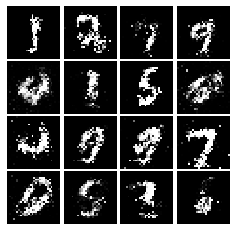

Epoch: 6, Iter: 2820, D: 1.279, G:0.9544


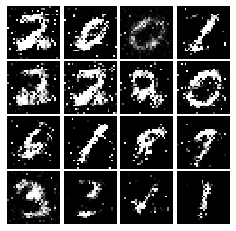

Epoch: 6, Iter: 2840, D: 1.36, G:0.8728


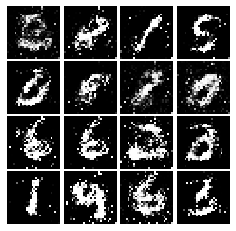

Epoch: 6, Iter: 2860, D: 1.318, G:0.8335


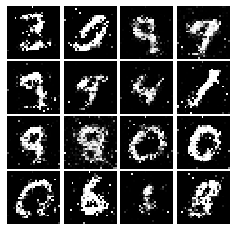

Epoch: 6, Iter: 2880, D: 1.243, G:0.9296


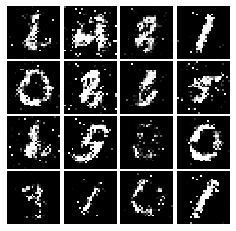

Epoch: 6, Iter: 2900, D: 1.29, G:0.8228


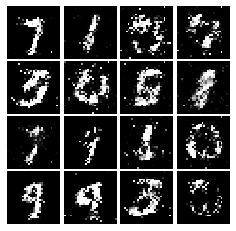

Epoch: 6, Iter: 2920, D: 1.445, G:0.7766


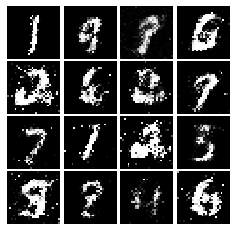

Epoch: 6, Iter: 2940, D: 1.274, G:0.8459


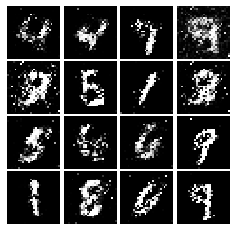

Epoch: 6, Iter: 2960, D: 1.403, G:0.7607


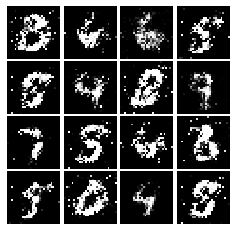

Epoch: 6, Iter: 2980, D: 1.273, G:0.8574


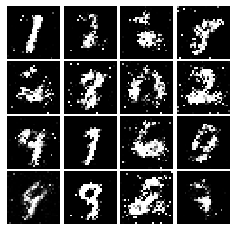

Epoch: 6, Iter: 3000, D: 1.408, G:0.991


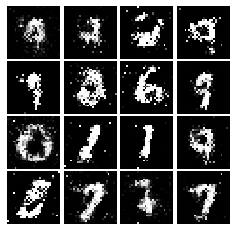

Epoch: 6, Iter: 3020, D: 1.304, G:2.227


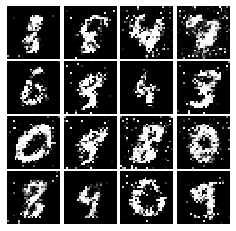

Epoch: 6, Iter: 3040, D: 1.269, G:0.8184


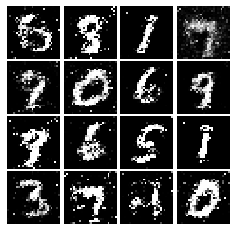

Epoch: 6, Iter: 3060, D: 1.352, G:0.8302


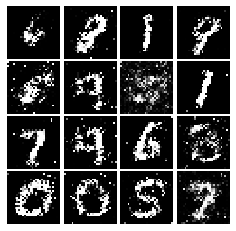

Epoch: 6, Iter: 3080, D: 1.291, G:0.9102


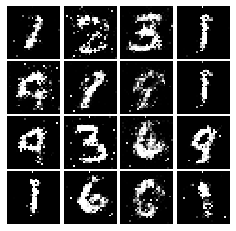

Epoch: 6, Iter: 3100, D: 1.299, G:0.7614


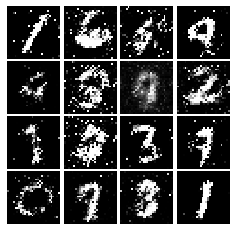

Epoch: 6, Iter: 3120, D: 1.323, G:0.8434


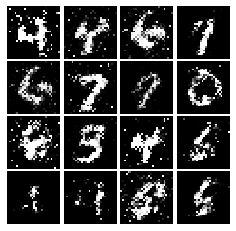

Epoch: 6, Iter: 3140, D: 1.418, G:0.8219


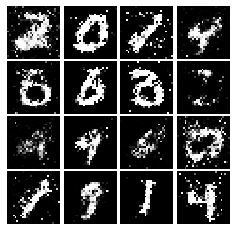

Epoch: 6, Iter: 3160, D: 1.277, G:0.9123


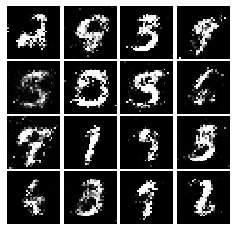

Epoch: 6, Iter: 3180, D: 1.361, G:0.7878


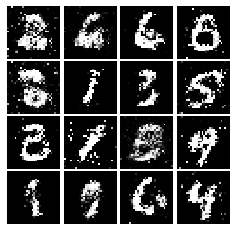

Epoch: 6, Iter: 3200, D: 1.322, G:0.8291


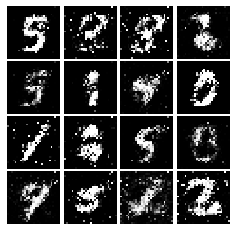

Epoch: 6, Iter: 3220, D: 1.257, G:0.9448


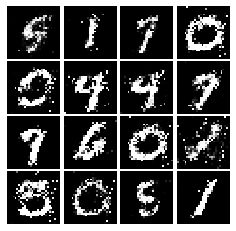

Epoch: 6, Iter: 3240, D: 1.292, G:0.8105


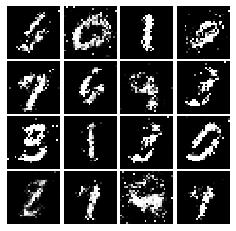

Epoch: 6, Iter: 3260, D: 1.371, G:1.036


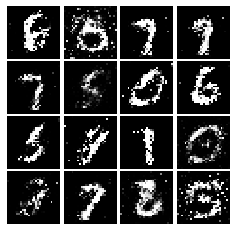

Epoch: 6, Iter: 3280, D: 1.408, G:0.7766


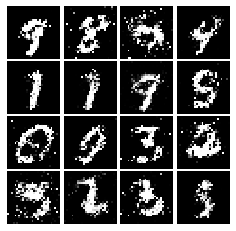

Epoch: 7, Iter: 3300, D: 1.239, G:0.887


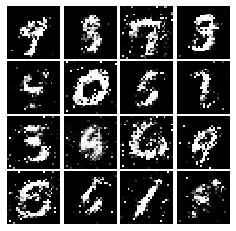

Epoch: 7, Iter: 3320, D: 1.295, G:0.7279


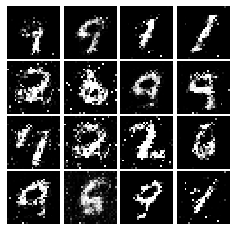

Epoch: 7, Iter: 3340, D: 1.267, G:0.927


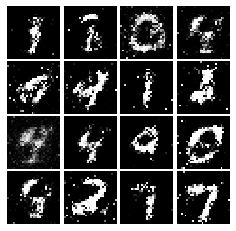

Epoch: 7, Iter: 3360, D: 1.335, G:0.8656


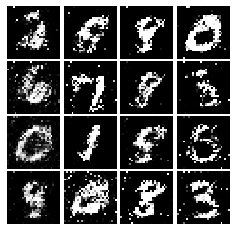

Epoch: 7, Iter: 3380, D: 1.33, G:0.8003


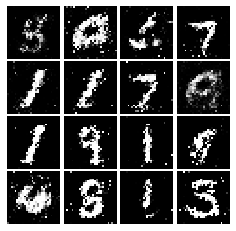

Epoch: 7, Iter: 3400, D: 1.346, G:0.7866


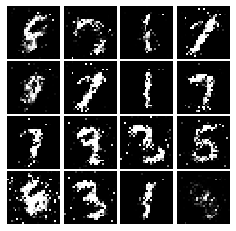

Epoch: 7, Iter: 3420, D: 1.264, G:0.8124


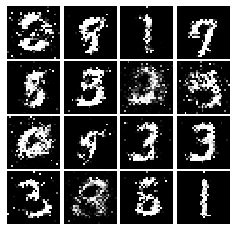

Epoch: 7, Iter: 3440, D: 1.292, G:0.8426


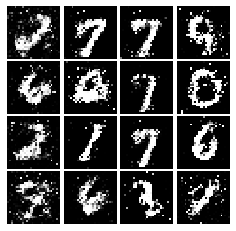

Epoch: 7, Iter: 3460, D: 1.287, G:0.7851


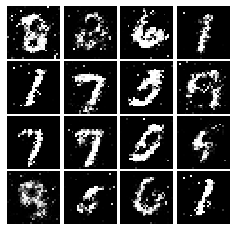

Epoch: 7, Iter: 3480, D: 1.305, G:0.7719


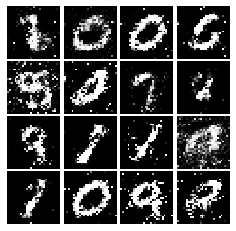

Epoch: 7, Iter: 3500, D: 1.299, G:0.8009


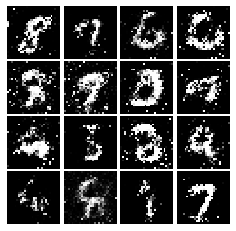

Epoch: 7, Iter: 3520, D: 1.35, G:0.7079


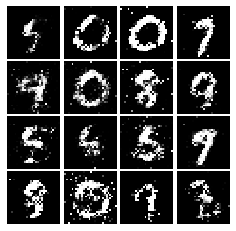

Epoch: 7, Iter: 3540, D: 1.278, G:0.8471


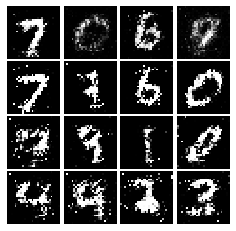

Epoch: 7, Iter: 3560, D: 1.273, G:0.9027


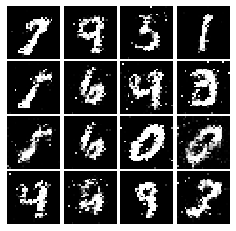

Epoch: 7, Iter: 3580, D: 1.305, G:0.8181


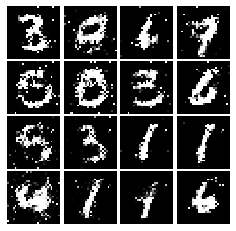

Epoch: 7, Iter: 3600, D: 1.297, G:0.7221


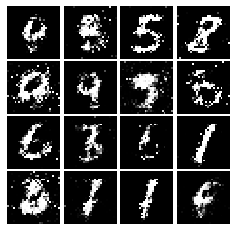

Epoch: 7, Iter: 3620, D: 1.267, G:0.8644


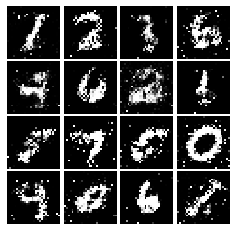

Epoch: 7, Iter: 3640, D: 1.339, G:0.891


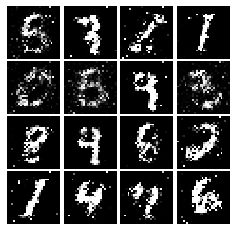

Epoch: 7, Iter: 3660, D: 1.35, G:0.7623


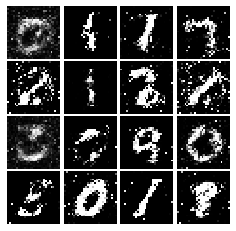

Epoch: 7, Iter: 3680, D: 1.335, G:0.8312


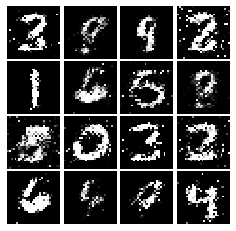

Epoch: 7, Iter: 3700, D: 1.42, G:0.7299


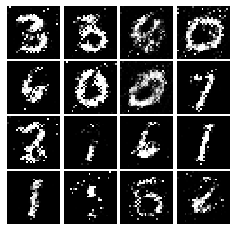

Epoch: 7, Iter: 3720, D: 1.295, G:0.8356


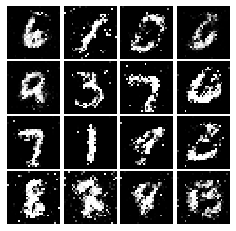

Epoch: 7, Iter: 3740, D: 1.361, G:0.7962


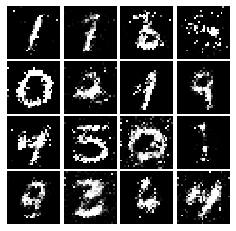

Epoch: 8, Iter: 3760, D: 1.342, G:0.8403


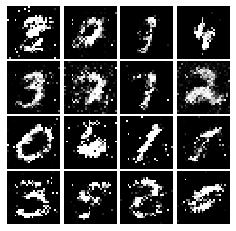

Epoch: 8, Iter: 3780, D: 1.319, G:0.8179


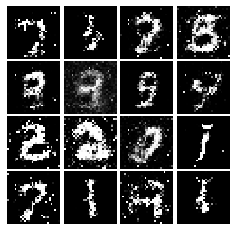

Epoch: 8, Iter: 3800, D: 1.256, G:0.7761


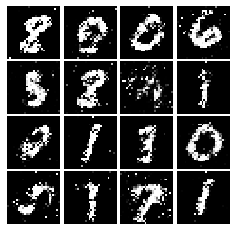

Epoch: 8, Iter: 3820, D: 1.247, G:0.9459


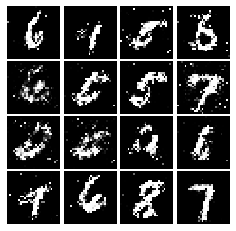

Epoch: 8, Iter: 3840, D: 1.219, G:0.834


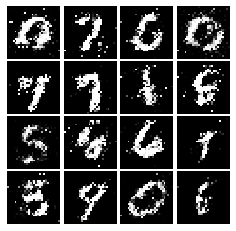

Epoch: 8, Iter: 3860, D: 1.359, G:0.8684


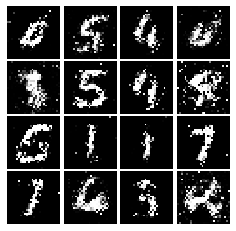

Epoch: 8, Iter: 3880, D: 1.325, G:0.9273


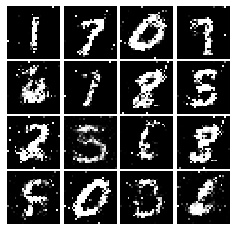

Epoch: 8, Iter: 3900, D: 1.396, G:0.7684


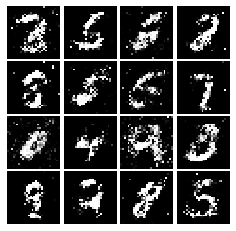

Epoch: 8, Iter: 3920, D: 1.345, G:0.7578


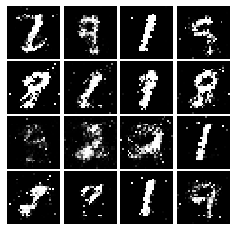

Epoch: 8, Iter: 3940, D: 1.332, G:0.8745


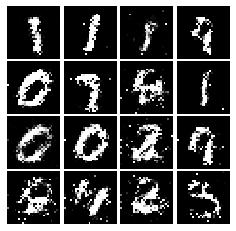

Epoch: 8, Iter: 3960, D: 1.32, G:0.7956


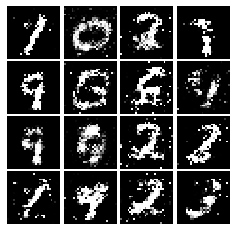

Epoch: 8, Iter: 3980, D: 1.341, G:0.8649


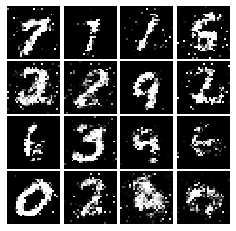

Epoch: 8, Iter: 4000, D: 1.353, G:0.7532


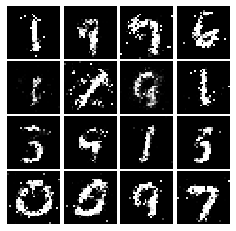

Epoch: 8, Iter: 4020, D: 1.27, G:0.7512


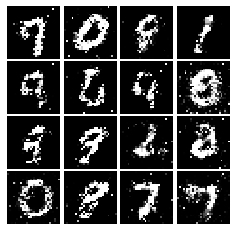

Epoch: 8, Iter: 4040, D: 1.302, G:0.8759


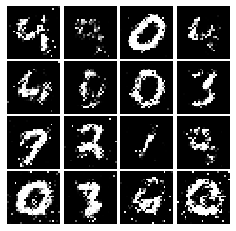

Epoch: 8, Iter: 4060, D: 1.316, G:0.8313


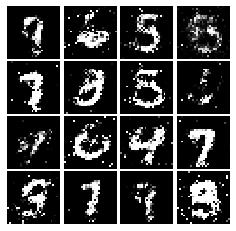

Epoch: 8, Iter: 4080, D: 1.345, G:0.8723


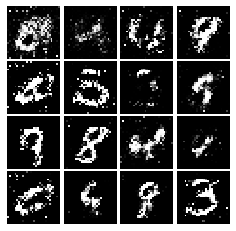

Epoch: 8, Iter: 4100, D: 1.427, G:0.7835


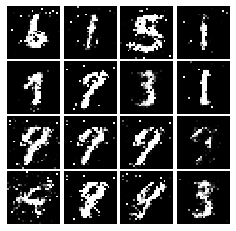

Epoch: 8, Iter: 4120, D: 1.375, G:0.8412


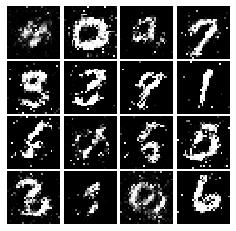

Epoch: 8, Iter: 4140, D: 1.34, G:0.9578


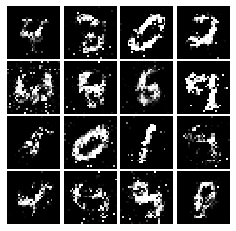

Epoch: 8, Iter: 4160, D: 1.29, G:0.866


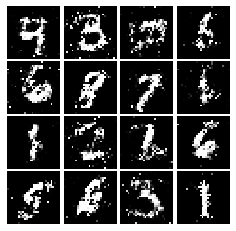

Epoch: 8, Iter: 4180, D: 1.294, G:0.8177


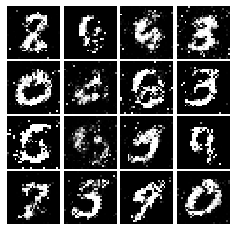

Epoch: 8, Iter: 4200, D: 1.271, G:0.8743


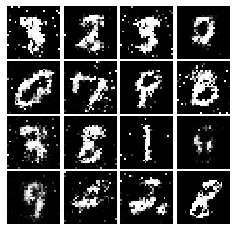

Epoch: 8, Iter: 4220, D: 1.463, G:0.7175


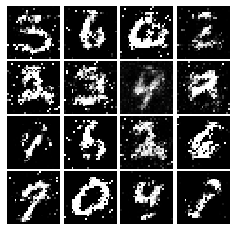

Epoch: 9, Iter: 4240, D: 1.324, G:0.9188


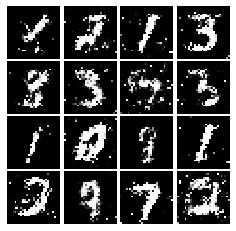

Epoch: 9, Iter: 4260, D: 1.379, G:0.8534


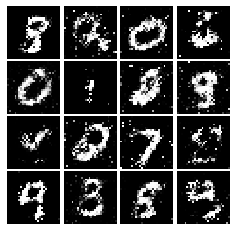

Epoch: 9, Iter: 4280, D: 1.466, G:0.7909


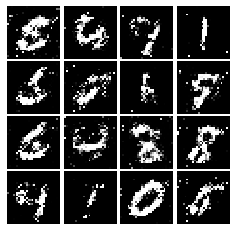

Epoch: 9, Iter: 4300, D: 1.349, G:0.914


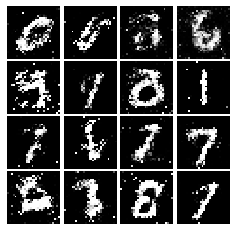

Epoch: 9, Iter: 4320, D: 1.367, G:0.8019


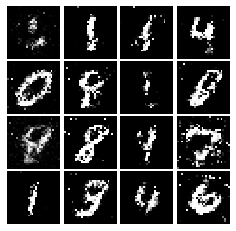

Epoch: 9, Iter: 4340, D: 1.337, G:0.8365


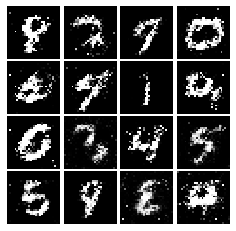

Epoch: 9, Iter: 4360, D: 1.352, G:0.8682


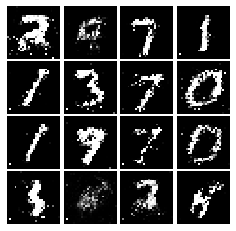

Epoch: 9, Iter: 4380, D: 1.418, G:0.7687


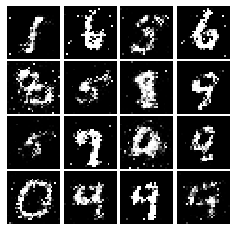

Epoch: 9, Iter: 4400, D: 1.283, G:0.8491


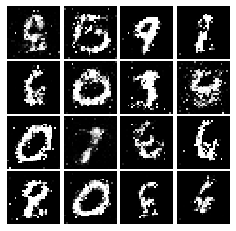

Epoch: 9, Iter: 4420, D: 1.28, G:0.7296


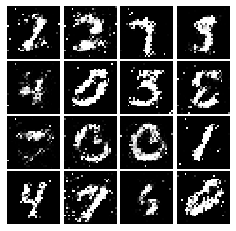

Epoch: 9, Iter: 4440, D: 1.372, G:0.7655


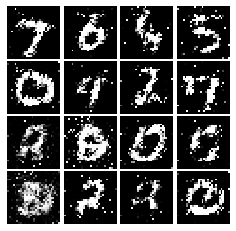

Epoch: 9, Iter: 4460, D: 1.318, G:0.802


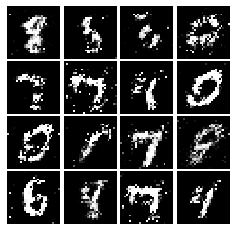

Epoch: 9, Iter: 4480, D: 1.262, G:0.7952


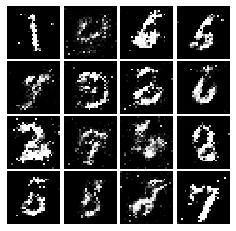

Epoch: 9, Iter: 4500, D: 1.378, G:0.7507


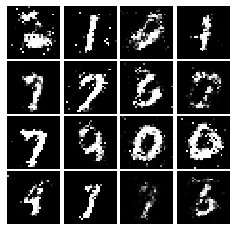

Epoch: 9, Iter: 4520, D: 1.413, G:0.7949


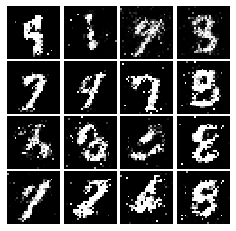

Epoch: 9, Iter: 4540, D: 1.364, G:0.7797


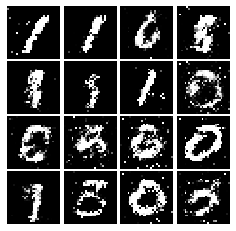

Epoch: 9, Iter: 4560, D: 1.393, G:0.7684


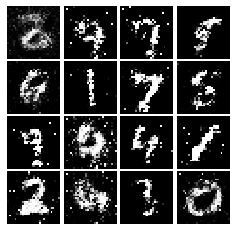

Epoch: 9, Iter: 4580, D: 1.41, G:0.7449


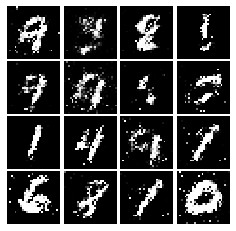

Epoch: 9, Iter: 4600, D: 1.323, G:0.7617


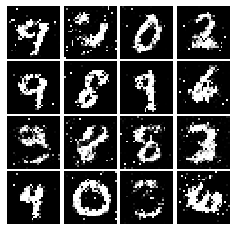

Epoch: 9, Iter: 4620, D: 1.301, G:0.7688


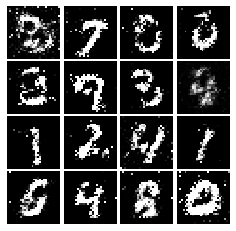

Epoch: 9, Iter: 4640, D: 1.334, G:0.7733


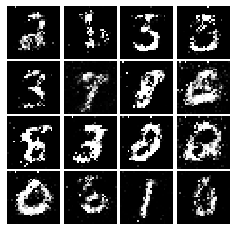

Epoch: 9, Iter: 4660, D: 1.281, G:0.7613


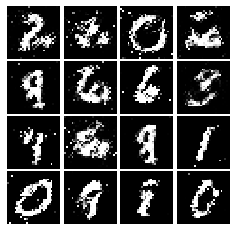

Epoch: 9, Iter: 4680, D: 1.412, G:0.7799


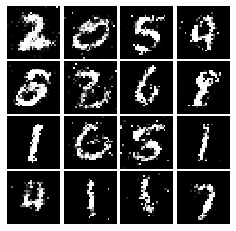

Final images


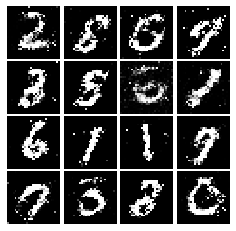

In [60]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [62]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_fake-1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [63]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.7604, G:0.4326


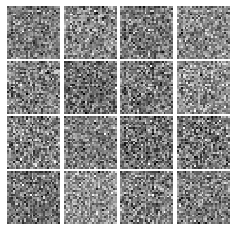

Epoch: 0, Iter: 20, D: 0.06152, G:1.203


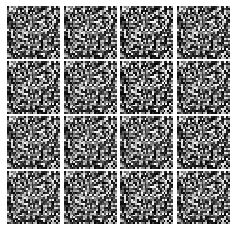

Epoch: 0, Iter: 40, D: 0.00731, G:0.65


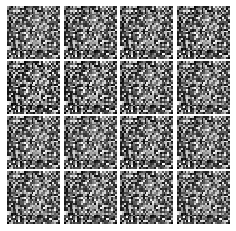

Epoch: 0, Iter: 60, D: 0.07837, G:1.029


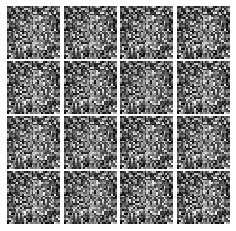

Epoch: 0, Iter: 80, D: 0.02437, G:0.5787


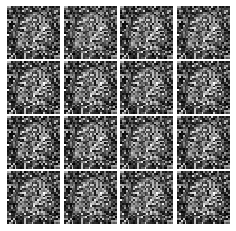

Epoch: 0, Iter: 100, D: 1.848, G:0.2661


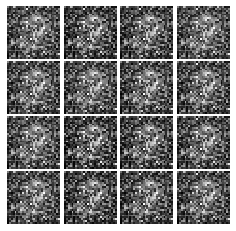

Epoch: 0, Iter: 120, D: 0.04175, G:0.677


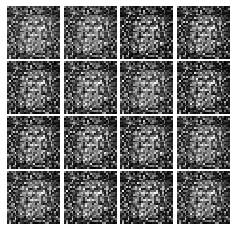

Epoch: 0, Iter: 140, D: 0.1872, G:0.1588


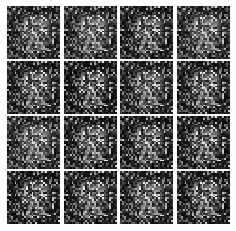

Epoch: 0, Iter: 160, D: 0.4212, G:0.6828


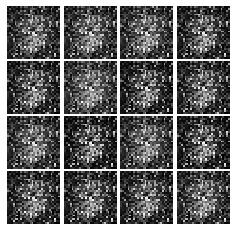

Epoch: 0, Iter: 180, D: 0.4421, G:0.005762


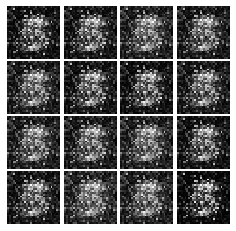

Epoch: 0, Iter: 200, D: 0.1421, G:0.3934


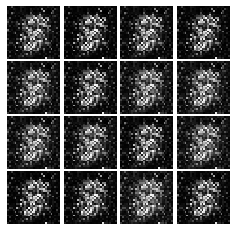

Epoch: 0, Iter: 220, D: 0.2332, G:0.2887


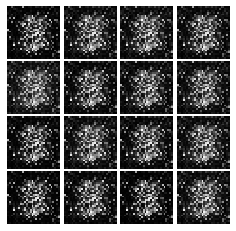

Epoch: 0, Iter: 240, D: 0.1345, G:0.4274


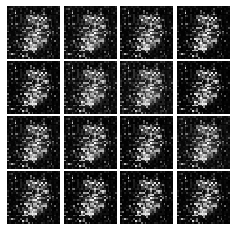

Epoch: 0, Iter: 260, D: 0.09442, G:0.6224


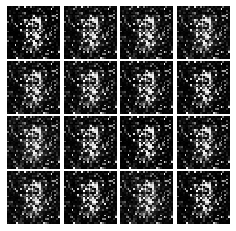

Epoch: 0, Iter: 280, D: 0.1694, G:0.2345


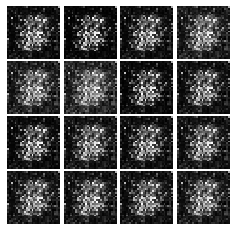

Epoch: 0, Iter: 300, D: 0.2437, G:0.9783


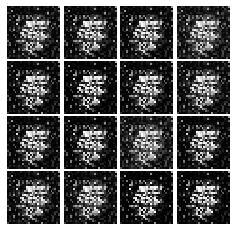

Epoch: 0, Iter: 320, D: 0.08132, G:0.395


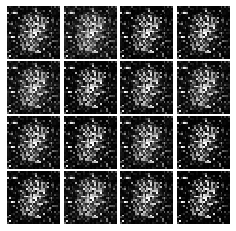

Epoch: 0, Iter: 340, D: 0.1028, G:0.4269


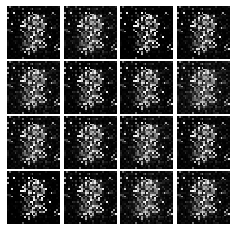

Epoch: 0, Iter: 360, D: 0.05822, G:0.4578


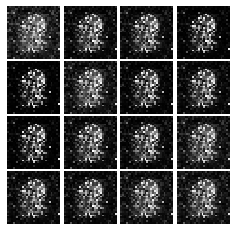

Epoch: 0, Iter: 380, D: 0.07716, G:0.6896


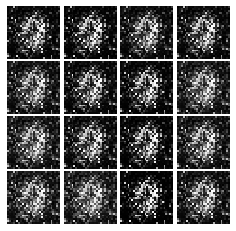

Epoch: 0, Iter: 400, D: 0.09815, G:0.5964


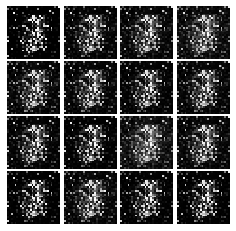

Epoch: 0, Iter: 420, D: 0.252, G:0.4123


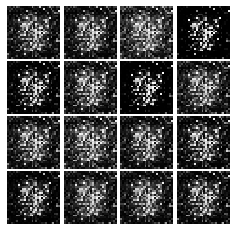

Epoch: 0, Iter: 440, D: 0.1471, G:0.5467


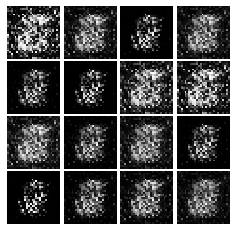

Epoch: 0, Iter: 460, D: 0.1273, G:0.3427


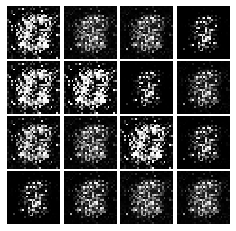

Epoch: 1, Iter: 480, D: 0.8322, G:0.539


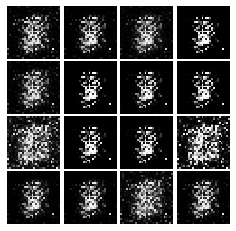

Epoch: 1, Iter: 500, D: 0.08995, G:0.506


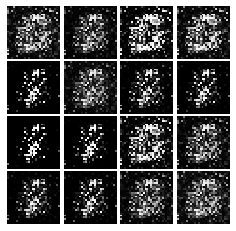

Epoch: 1, Iter: 520, D: 0.07893, G:0.5252


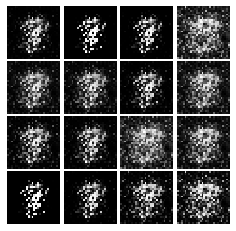

Epoch: 1, Iter: 540, D: 0.161, G:0.3988


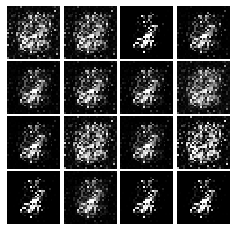

Epoch: 1, Iter: 560, D: 0.0885, G:0.4388


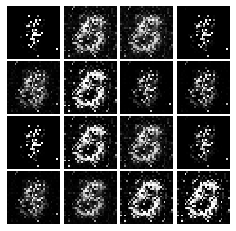

Epoch: 1, Iter: 580, D: 0.2516, G:0.03161


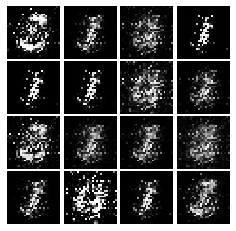

Epoch: 1, Iter: 600, D: 0.2375, G:0.2998


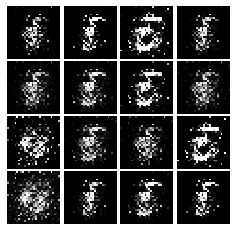

Epoch: 1, Iter: 620, D: 0.1403, G:0.2767


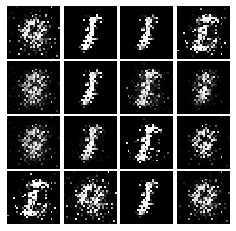

Epoch: 1, Iter: 640, D: 0.163, G:0.1014


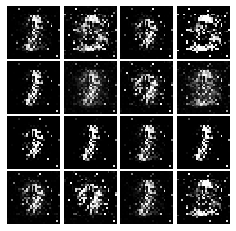

Epoch: 1, Iter: 660, D: 0.1491, G:0.3458


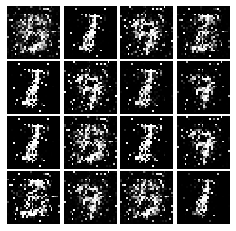

Epoch: 1, Iter: 680, D: 0.1135, G:0.353


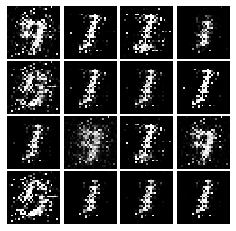

Epoch: 1, Iter: 700, D: 0.1013, G:0.5156


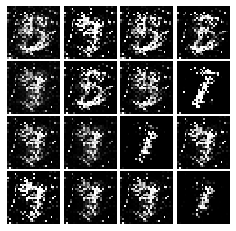

Epoch: 1, Iter: 720, D: 0.1289, G:0.3496


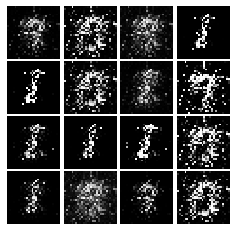

Epoch: 1, Iter: 740, D: 0.1632, G:0.2289


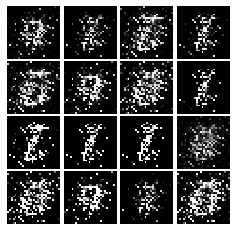

Epoch: 1, Iter: 760, D: 0.1423, G:0.3594


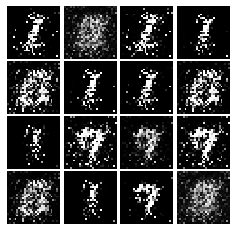

Epoch: 1, Iter: 780, D: 0.1541, G:0.4316


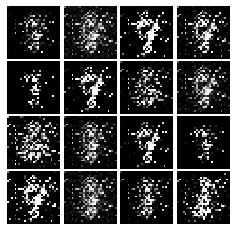

Epoch: 1, Iter: 800, D: 0.7047, G:0.3112


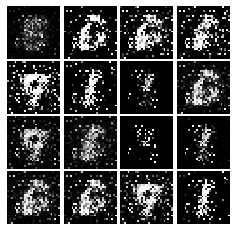

Epoch: 1, Iter: 820, D: 0.1186, G:0.324


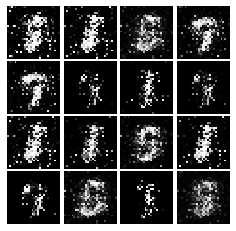

Epoch: 1, Iter: 840, D: 0.1224, G:0.2653


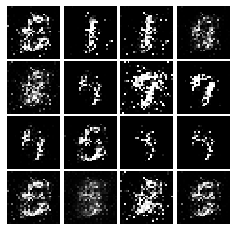

Epoch: 1, Iter: 860, D: 0.1191, G:0.2815


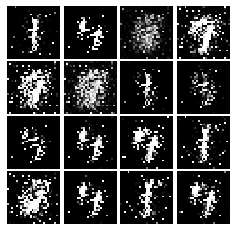

Epoch: 1, Iter: 880, D: 0.1405, G:0.3356


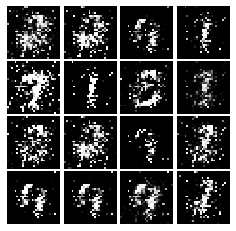

Epoch: 1, Iter: 900, D: 0.1291, G:0.3183


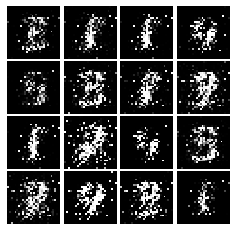

Epoch: 1, Iter: 920, D: 0.1371, G:0.3624


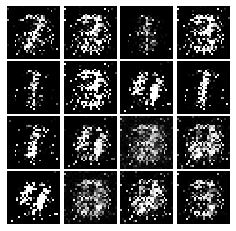

Epoch: 2, Iter: 940, D: 0.1096, G:0.3637


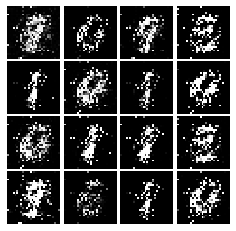

Epoch: 2, Iter: 960, D: 0.1327, G:0.4976


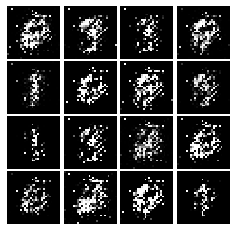

Epoch: 2, Iter: 980, D: 0.1136, G:0.3265


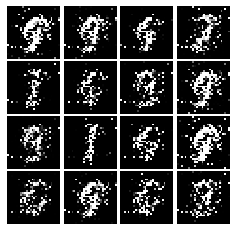

Epoch: 2, Iter: 1000, D: 0.08333, G:0.4272


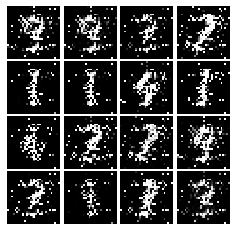

Epoch: 2, Iter: 1020, D: 0.1197, G:0.3058


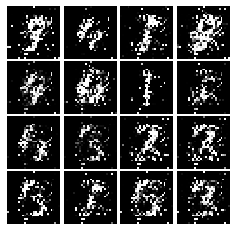

Epoch: 2, Iter: 1040, D: 0.1498, G:0.3756


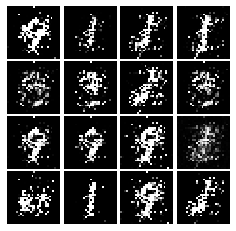

Epoch: 2, Iter: 1060, D: 0.1773, G:0.3217


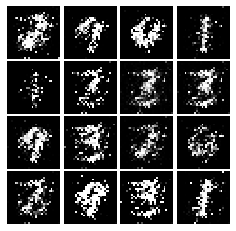

Epoch: 2, Iter: 1080, D: 0.1045, G:0.1643


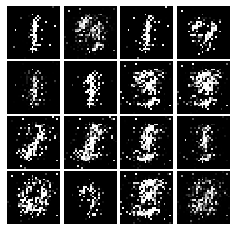

Epoch: 2, Iter: 1100, D: 0.4028, G:0.06822


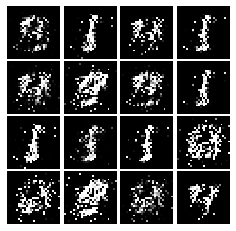

Epoch: 2, Iter: 1120, D: 0.1351, G:0.3358


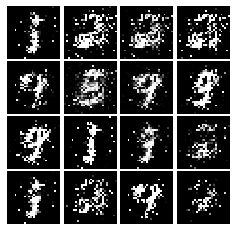

Epoch: 2, Iter: 1140, D: 0.1953, G:0.3837


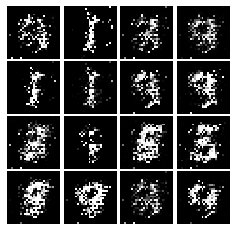

Epoch: 2, Iter: 1160, D: 0.1622, G:0.3209


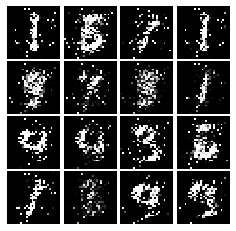

Epoch: 2, Iter: 1180, D: 0.1321, G:0.3358


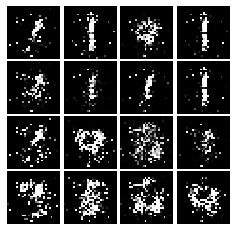

Epoch: 2, Iter: 1200, D: 0.1904, G:0.3175


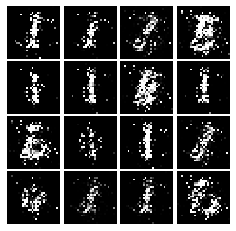

Epoch: 2, Iter: 1220, D: 0.5661, G:1.365


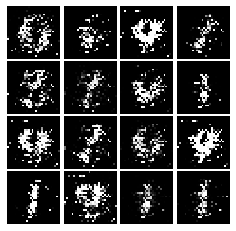

Epoch: 2, Iter: 1240, D: 0.1703, G:0.277


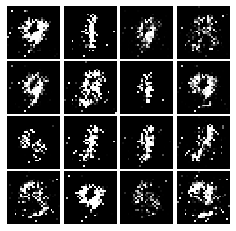

Epoch: 2, Iter: 1260, D: 0.1418, G:0.2626


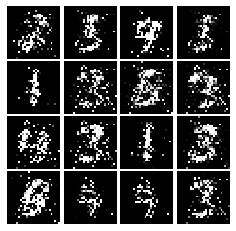

Epoch: 2, Iter: 1280, D: 0.1211, G:0.5639


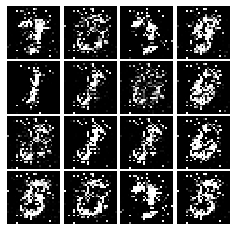

Epoch: 2, Iter: 1300, D: 0.1233, G:0.294


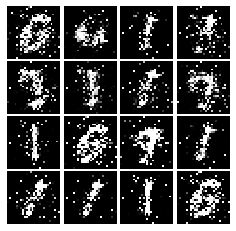

Epoch: 2, Iter: 1320, D: 0.1682, G:1.565


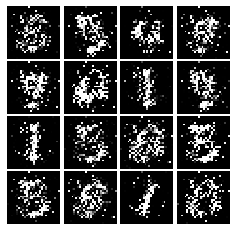

Epoch: 2, Iter: 1340, D: 0.1517, G:0.2613


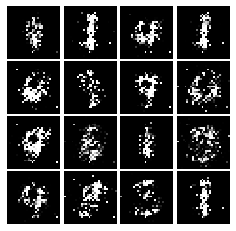

Epoch: 2, Iter: 1360, D: 0.165, G:0.3251


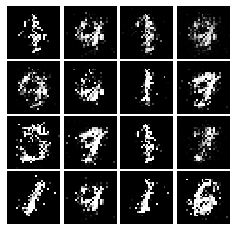

Epoch: 2, Iter: 1380, D: 0.1847, G:0.648


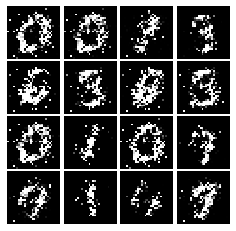

Epoch: 2, Iter: 1400, D: 0.1564, G:0.3028


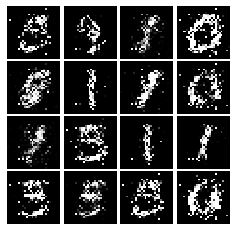

Epoch: 3, Iter: 1420, D: 0.2145, G:0.05878


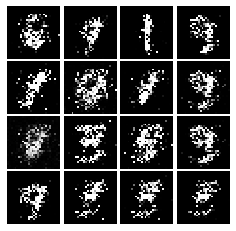

Epoch: 3, Iter: 1440, D: 0.1357, G:0.2996


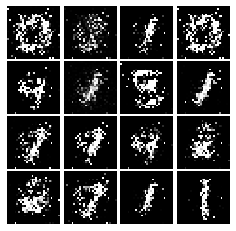

Epoch: 3, Iter: 1460, D: 0.1935, G:0.1848


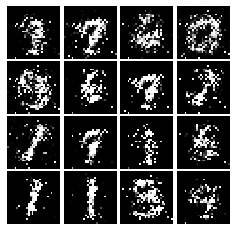

Epoch: 3, Iter: 1480, D: 0.147, G:0.2521


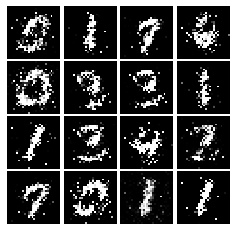

Epoch: 3, Iter: 1500, D: 0.1624, G:0.2814


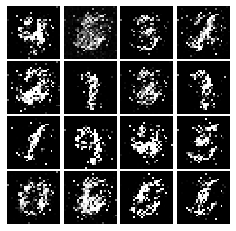

Epoch: 3, Iter: 1520, D: 0.1486, G:0.5819


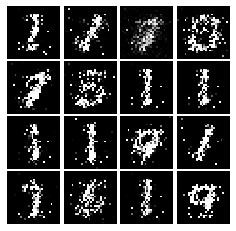

Epoch: 3, Iter: 1540, D: 0.1594, G:0.2594


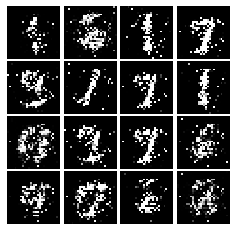

Epoch: 3, Iter: 1560, D: 0.1576, G:0.2591


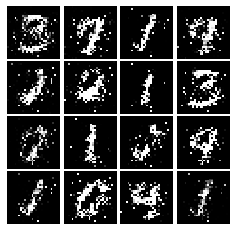

Epoch: 3, Iter: 1580, D: 0.1659, G:0.2867


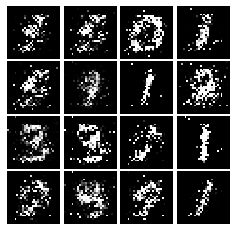

Epoch: 3, Iter: 1600, D: 0.1643, G:0.2403


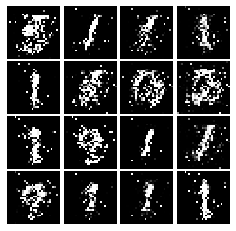

Epoch: 3, Iter: 1620, D: 0.1868, G:0.2837


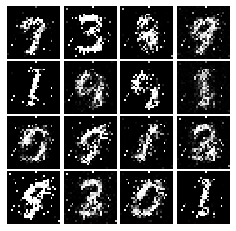

Epoch: 3, Iter: 1640, D: 0.1479, G:0.2883


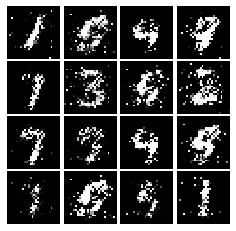

Epoch: 3, Iter: 1660, D: 0.1843, G:0.1196


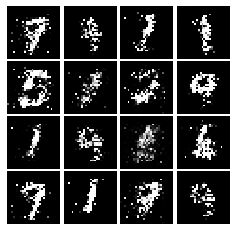

Epoch: 3, Iter: 1680, D: 0.1645, G:0.2425


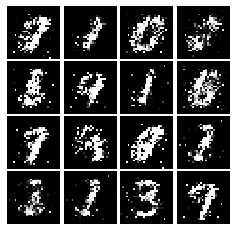

Epoch: 3, Iter: 1700, D: 0.2222, G:0.2808


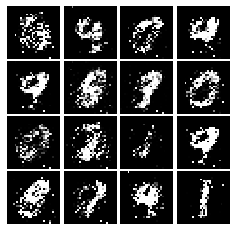

Epoch: 3, Iter: 1720, D: 0.1719, G:0.2847


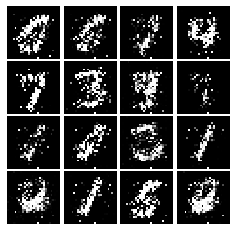

Epoch: 3, Iter: 1740, D: 0.1882, G:0.2543


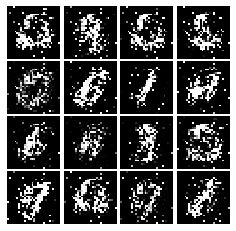

Epoch: 3, Iter: 1760, D: 0.1248, G:0.3291


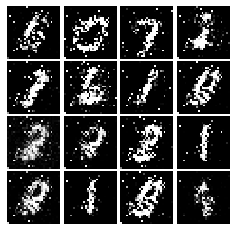

Epoch: 3, Iter: 1780, D: 0.175, G:0.2388


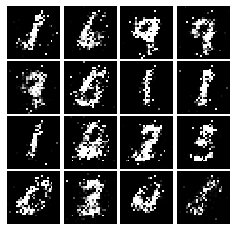

Epoch: 3, Iter: 1800, D: 0.2038, G:0.2671


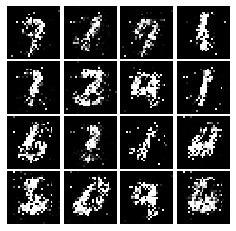

Epoch: 3, Iter: 1820, D: 0.1643, G:0.2872


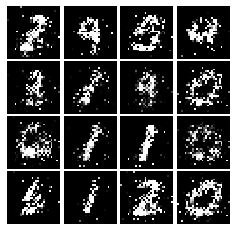

Epoch: 3, Iter: 1840, D: 0.2183, G:0.3427


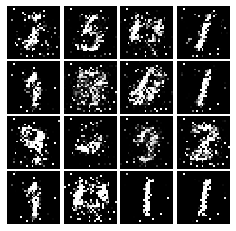

Epoch: 3, Iter: 1860, D: 0.1987, G:0.2854


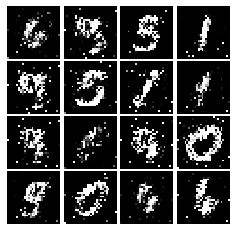

Epoch: 4, Iter: 1880, D: 0.1757, G:0.2102


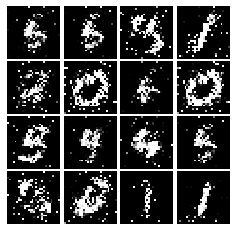

Epoch: 4, Iter: 1900, D: 0.1914, G:0.2015


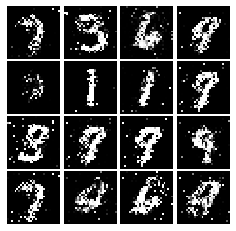

Epoch: 4, Iter: 1920, D: 0.1578, G:0.2114


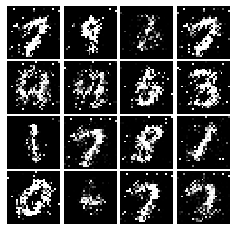

Epoch: 4, Iter: 1940, D: 0.2051, G:0.2841


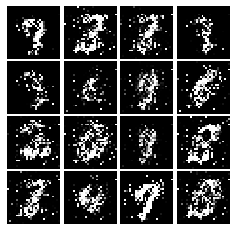

Epoch: 4, Iter: 1960, D: 0.2023, G:0.2649


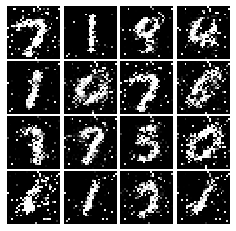

Epoch: 4, Iter: 1980, D: 0.1949, G:0.2134


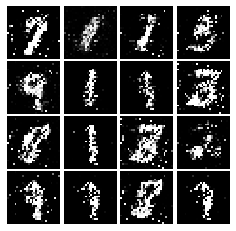

Epoch: 4, Iter: 2000, D: 0.2049, G:0.2725


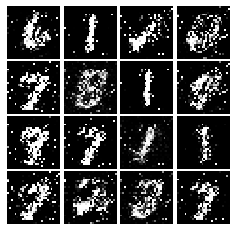

Epoch: 4, Iter: 2020, D: 0.2014, G:0.2021


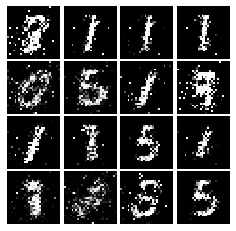

Epoch: 4, Iter: 2040, D: 0.2228, G:0.2416


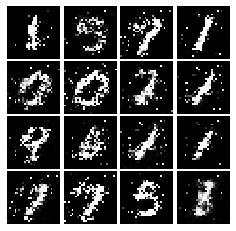

Epoch: 4, Iter: 2060, D: 0.2124, G:0.1812


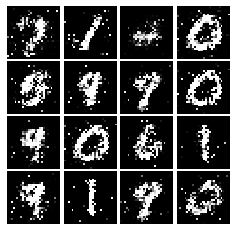

Epoch: 4, Iter: 2080, D: 0.2275, G:0.2036


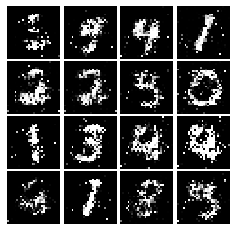

Epoch: 4, Iter: 2100, D: 0.2009, G:0.1875


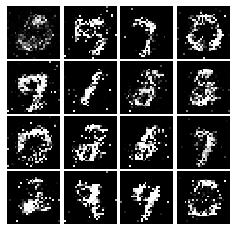

Epoch: 4, Iter: 2120, D: 0.2264, G:0.2381


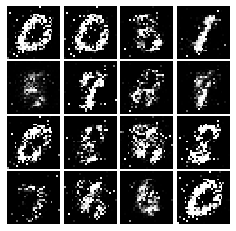

Epoch: 4, Iter: 2140, D: 0.1942, G:0.1971


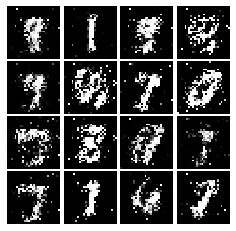

Epoch: 4, Iter: 2160, D: 0.2164, G:0.2131


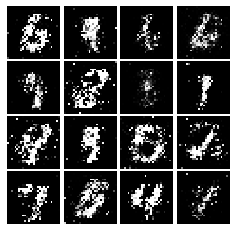

Epoch: 4, Iter: 2180, D: 0.2038, G:0.192


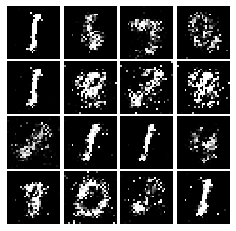

Epoch: 4, Iter: 2200, D: 0.2029, G:0.2645


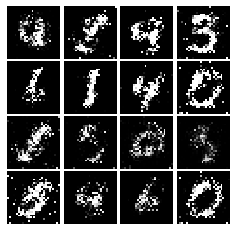

Epoch: 4, Iter: 2220, D: 0.2317, G:0.1992


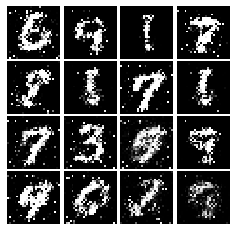

Epoch: 4, Iter: 2240, D: 0.2134, G:0.1845


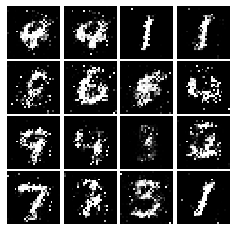

Epoch: 4, Iter: 2260, D: 0.2211, G:0.1967


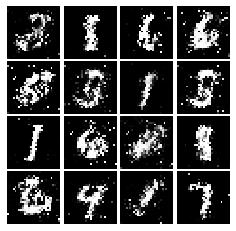

Epoch: 4, Iter: 2280, D: 0.2, G:0.1794


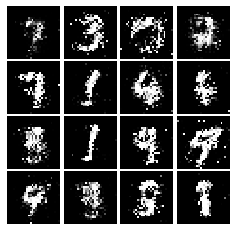

Epoch: 4, Iter: 2300, D: 0.211, G:0.1853


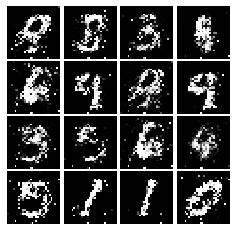

Epoch: 4, Iter: 2320, D: 0.2186, G:0.1961


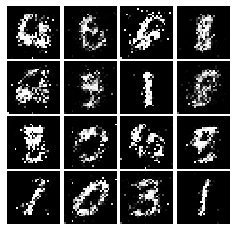

Epoch: 4, Iter: 2340, D: 0.2156, G:0.1835


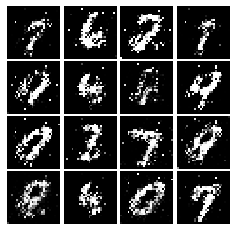

Epoch: 5, Iter: 2360, D: 0.2056, G:0.1966


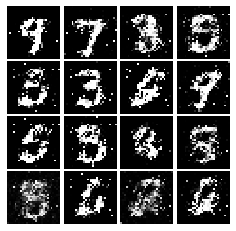

Epoch: 5, Iter: 2380, D: 0.2044, G:0.2329


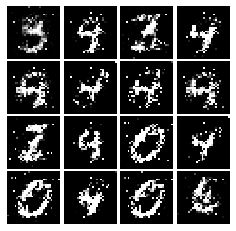

Epoch: 5, Iter: 2400, D: 0.2155, G:0.2208


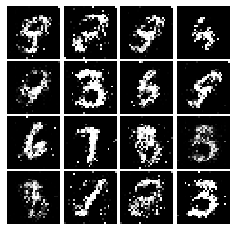

Epoch: 5, Iter: 2420, D: 0.2079, G:0.2198


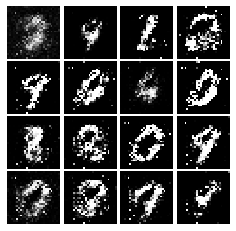

Epoch: 5, Iter: 2440, D: 0.2141, G:0.1928


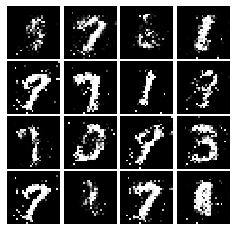

Epoch: 5, Iter: 2460, D: 0.2138, G:0.1695


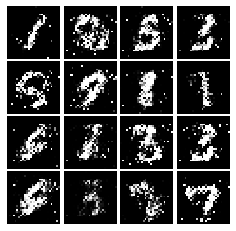

Epoch: 5, Iter: 2480, D: 0.2117, G:0.1627


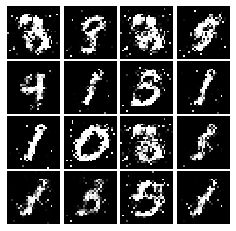

Epoch: 5, Iter: 2500, D: 0.1913, G:0.2612


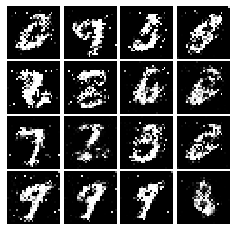

Epoch: 5, Iter: 2520, D: 0.2504, G:0.1831


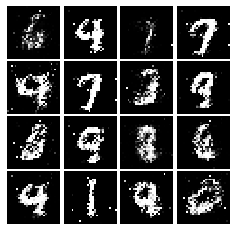

Epoch: 5, Iter: 2540, D: 0.188, G:0.2339


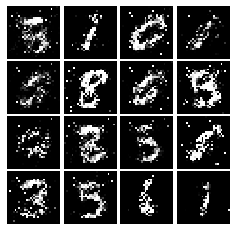

Epoch: 5, Iter: 2560, D: 0.2037, G:0.1707


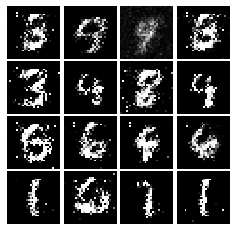

Epoch: 5, Iter: 2580, D: 0.2246, G:0.2133


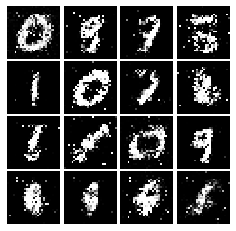

Epoch: 5, Iter: 2600, D: 0.2806, G:0.1877


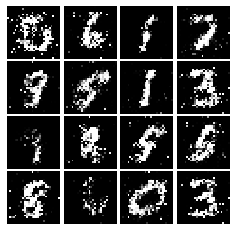

Epoch: 5, Iter: 2620, D: 0.2217, G:0.1756


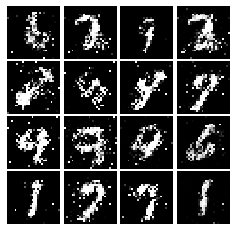

Epoch: 5, Iter: 2640, D: 0.2321, G:0.1888


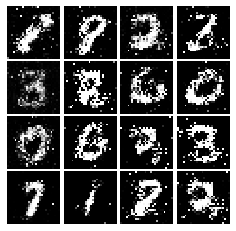

Epoch: 5, Iter: 2660, D: 0.2237, G:0.1988


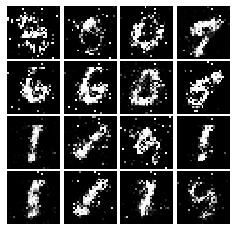

Epoch: 5, Iter: 2680, D: 0.2548, G:0.1529


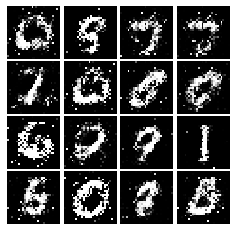

Epoch: 5, Iter: 2700, D: 0.2468, G:0.1618


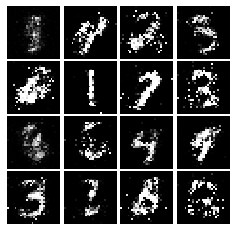

Epoch: 5, Iter: 2720, D: 0.2351, G:0.1676


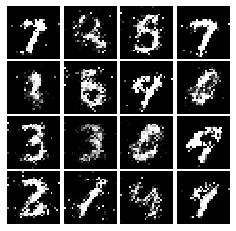

Epoch: 5, Iter: 2740, D: 0.2578, G:0.151


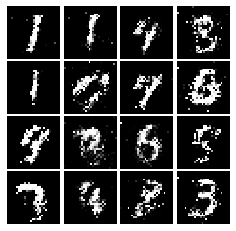

Epoch: 5, Iter: 2760, D: 0.2277, G:0.1804


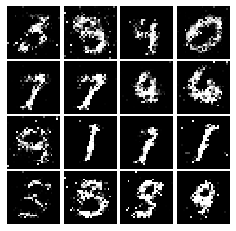

Epoch: 5, Iter: 2780, D: 0.2382, G:0.1939


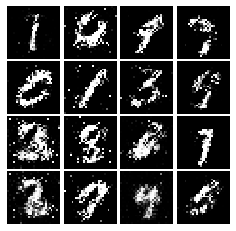

Epoch: 5, Iter: 2800, D: 0.2054, G:0.1853


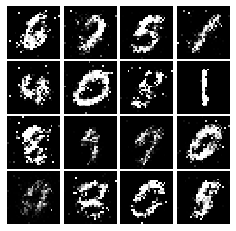

Epoch: 6, Iter: 2820, D: 0.2361, G:0.189


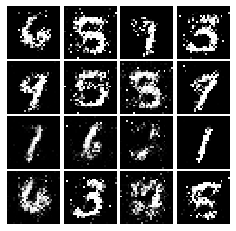

Epoch: 6, Iter: 2840, D: 0.2079, G:0.2913


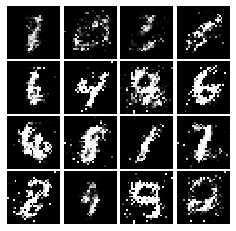

Epoch: 6, Iter: 2860, D: 0.234, G:0.1844


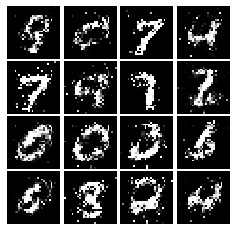

Epoch: 6, Iter: 2880, D: 0.2048, G:0.2087


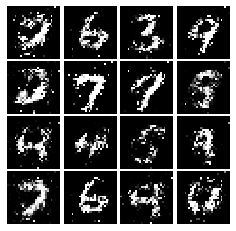

Epoch: 6, Iter: 2900, D: 0.2214, G:0.1692


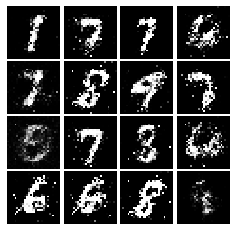

Epoch: 6, Iter: 2920, D: 0.2541, G:0.1628


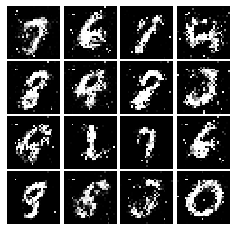

Epoch: 6, Iter: 2940, D: 0.2169, G:0.1648


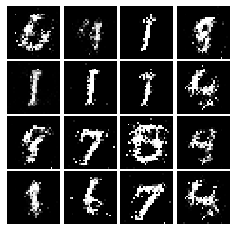

Epoch: 6, Iter: 2960, D: 0.2253, G:0.1761


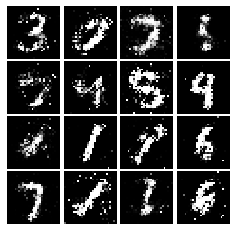

Epoch: 6, Iter: 2980, D: 0.2143, G:0.1637


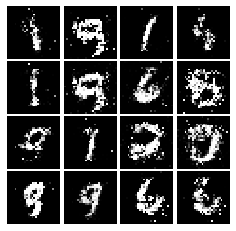

Epoch: 6, Iter: 3000, D: 0.2105, G:0.1543


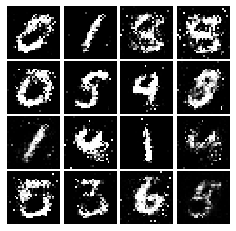

Epoch: 6, Iter: 3020, D: 0.2495, G:0.1774


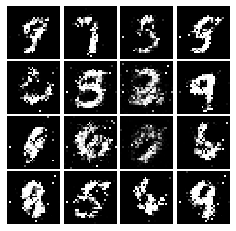

Epoch: 6, Iter: 3040, D: 0.2336, G:0.1756


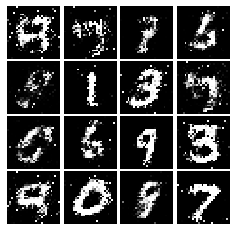

Epoch: 6, Iter: 3060, D: 0.229, G:0.1525


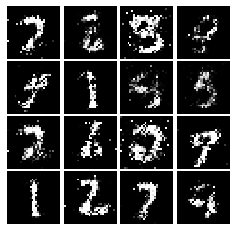

Epoch: 6, Iter: 3080, D: 0.2373, G:0.1598


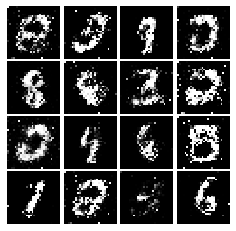

Epoch: 6, Iter: 3100, D: 0.2298, G:0.1698


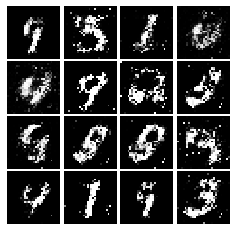

Epoch: 6, Iter: 3120, D: 0.2222, G:0.1486


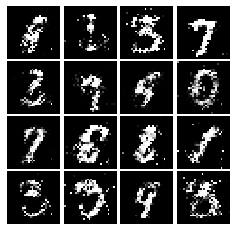

Epoch: 6, Iter: 3140, D: 0.2231, G:0.1951


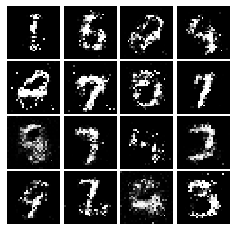

Epoch: 6, Iter: 3160, D: 0.2013, G:0.193


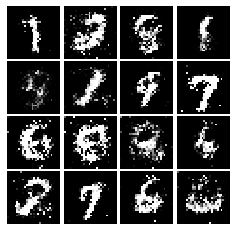

Epoch: 6, Iter: 3180, D: 0.2334, G:0.1715


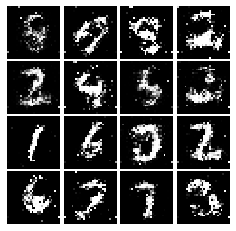

Epoch: 6, Iter: 3200, D: 0.2383, G:0.1726


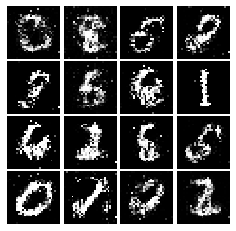

Epoch: 6, Iter: 3220, D: 0.2412, G:0.172


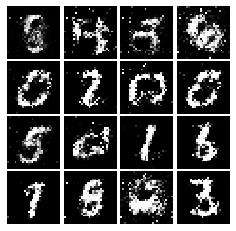

Epoch: 6, Iter: 3240, D: 0.2208, G:0.1597


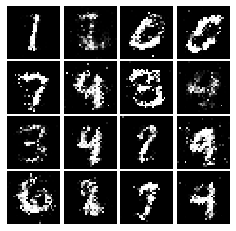

Epoch: 6, Iter: 3260, D: 0.2428, G:0.1473


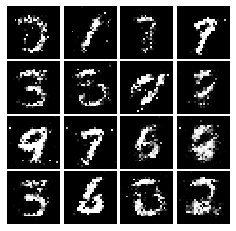

Epoch: 6, Iter: 3280, D: 0.2487, G:0.1693


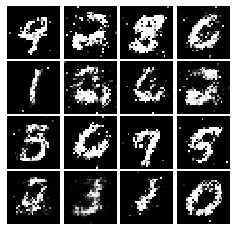

Epoch: 7, Iter: 3300, D: 0.2172, G:0.1593


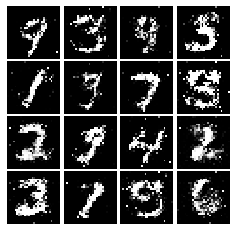

Epoch: 7, Iter: 3320, D: 0.2261, G:0.2107


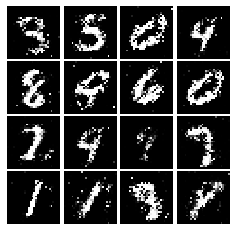

Epoch: 7, Iter: 3340, D: 0.2244, G:0.2151


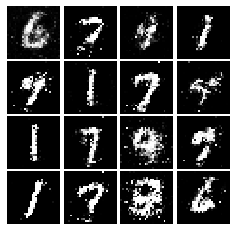

Epoch: 7, Iter: 3360, D: 0.2419, G:0.1538


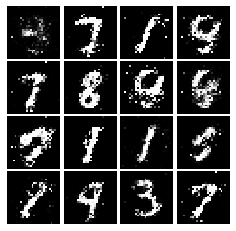

Epoch: 7, Iter: 3380, D: 0.2348, G:0.1925


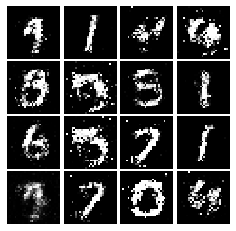

Epoch: 7, Iter: 3400, D: 0.2348, G:0.1618


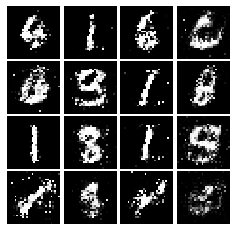

Epoch: 7, Iter: 3420, D: 0.2282, G:0.2024


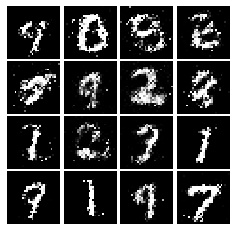

Epoch: 7, Iter: 3440, D: 0.2247, G:0.1832


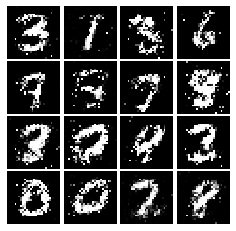

Epoch: 7, Iter: 3460, D: 0.2232, G:0.1692


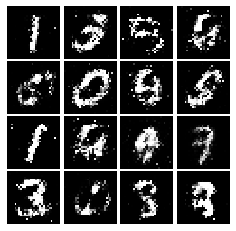

Epoch: 7, Iter: 3480, D: 0.2117, G:0.1698


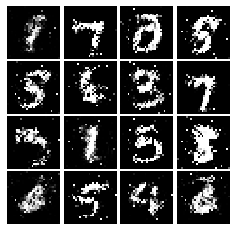

Epoch: 7, Iter: 3500, D: 0.2335, G:0.1814


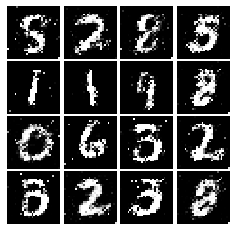

Epoch: 7, Iter: 3520, D: 0.256, G:0.1774


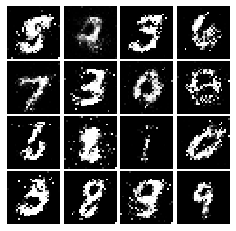

Epoch: 7, Iter: 3540, D: 0.232, G:0.1662


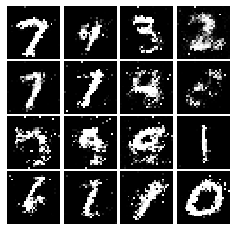

Epoch: 7, Iter: 3560, D: 0.2151, G:0.1692


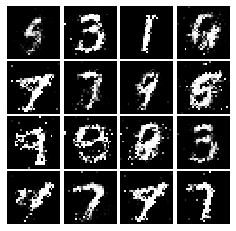

Epoch: 7, Iter: 3580, D: 0.2217, G:0.1831


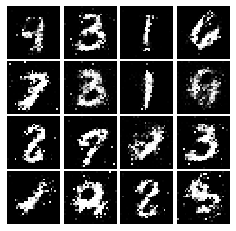

Epoch: 7, Iter: 3600, D: 0.2286, G:0.2079


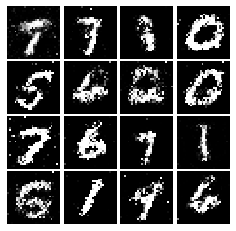

Epoch: 7, Iter: 3620, D: 0.2373, G:0.1605


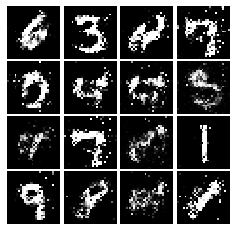

Epoch: 7, Iter: 3640, D: 0.2213, G:0.1787


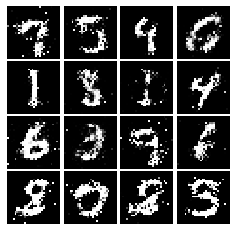

Epoch: 7, Iter: 3660, D: 0.2306, G:0.1783


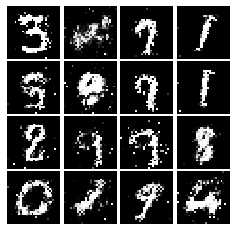

Epoch: 7, Iter: 3680, D: 0.2381, G:0.1685


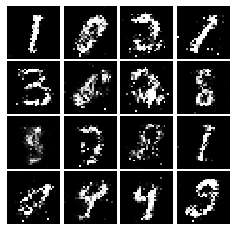

Epoch: 7, Iter: 3700, D: 0.2275, G:0.1669


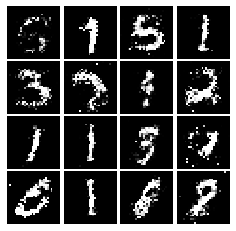

Epoch: 7, Iter: 3720, D: 0.2374, G:0.1632


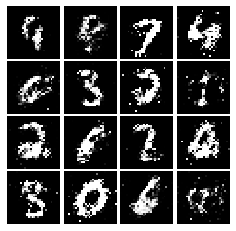

Epoch: 7, Iter: 3740, D: 0.2422, G:0.1518


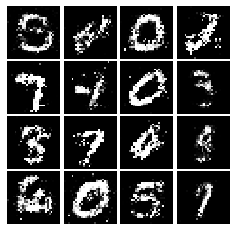

Epoch: 8, Iter: 3760, D: 0.2395, G:0.1744


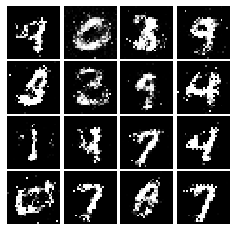

Epoch: 8, Iter: 3780, D: 0.2242, G:0.1933


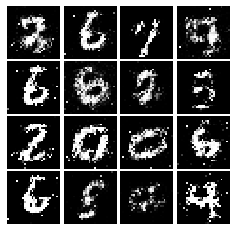

Epoch: 8, Iter: 3800, D: 0.2171, G:0.1714


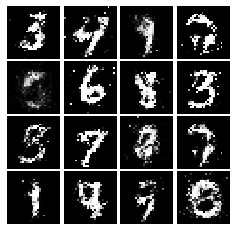

Epoch: 8, Iter: 3820, D: 0.2557, G:0.1812


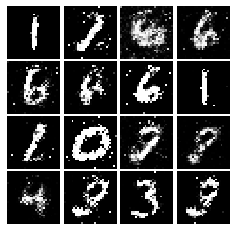

Epoch: 8, Iter: 3840, D: 0.2272, G:0.1619


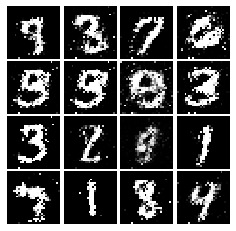

Epoch: 8, Iter: 3860, D: 0.2307, G:0.1636


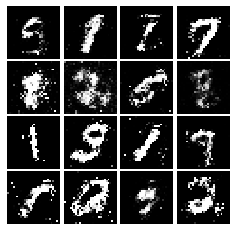

Epoch: 8, Iter: 3880, D: 0.2116, G:0.1486


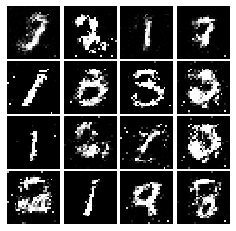

Epoch: 8, Iter: 3900, D: 0.2408, G:0.1827


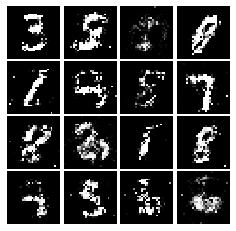

Epoch: 8, Iter: 3920, D: 0.2191, G:0.1789


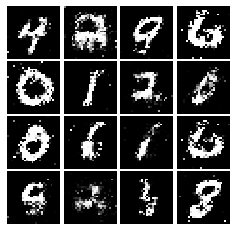

Epoch: 8, Iter: 3940, D: 0.233, G:0.1508


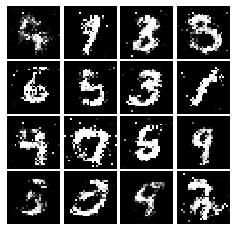

Epoch: 8, Iter: 3960, D: 0.2457, G:0.1686


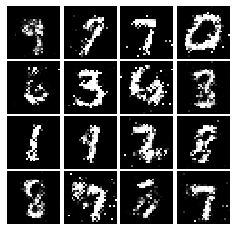

Epoch: 8, Iter: 3980, D: 0.2208, G:0.1966


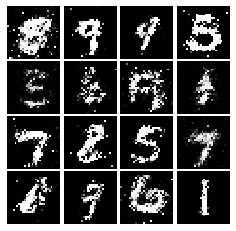

Epoch: 8, Iter: 4000, D: 0.2164, G:0.1801


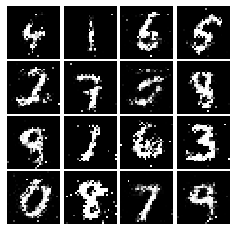

Epoch: 8, Iter: 4020, D: 0.221, G:0.1727


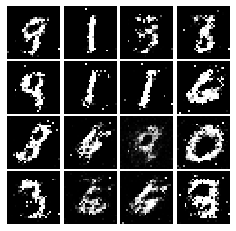

Epoch: 8, Iter: 4040, D: 0.2351, G:0.1804


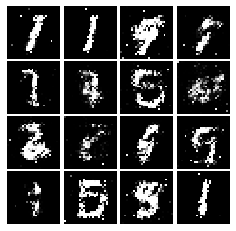

Epoch: 8, Iter: 4060, D: 0.2314, G:0.1737


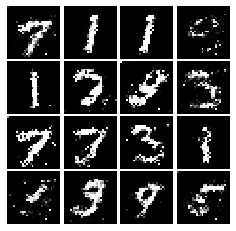

Epoch: 8, Iter: 4080, D: 0.2277, G:0.1912


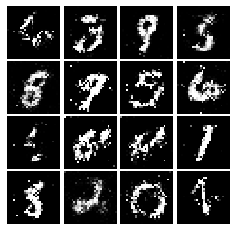

Epoch: 8, Iter: 4100, D: 0.2216, G:0.166


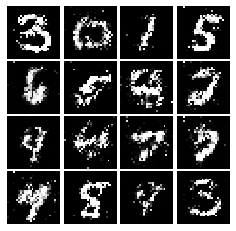

Epoch: 8, Iter: 4120, D: 0.2445, G:0.1461


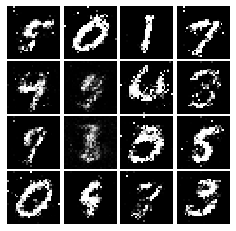

Epoch: 8, Iter: 4140, D: 0.2224, G:0.1737


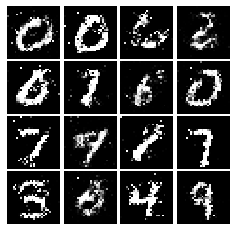

Epoch: 8, Iter: 4160, D: 0.2328, G:0.1828


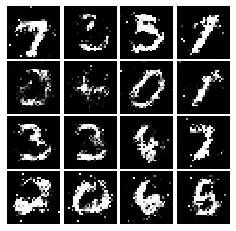

Epoch: 8, Iter: 4180, D: 0.2483, G:0.1636


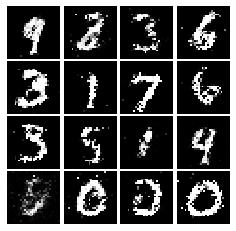

Epoch: 8, Iter: 4200, D: 0.2294, G:0.1545


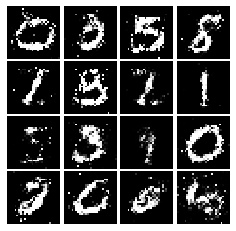

Epoch: 8, Iter: 4220, D: 0.2092, G:0.1813


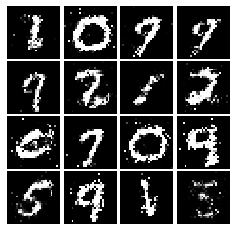

Epoch: 9, Iter: 4240, D: 0.2542, G:0.1551


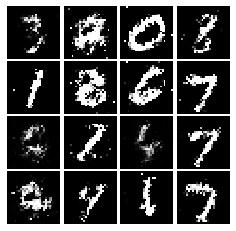

Epoch: 9, Iter: 4260, D: 0.2458, G:0.1691


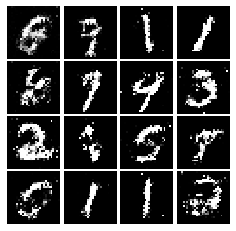

Epoch: 9, Iter: 4280, D: 0.2303, G:0.2001


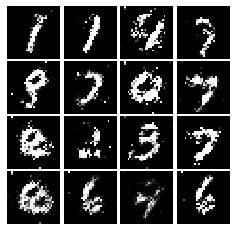

Epoch: 9, Iter: 4300, D: 0.2311, G:0.1514


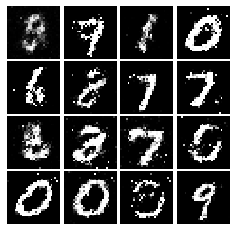

Epoch: 9, Iter: 4320, D: 0.2178, G:0.169


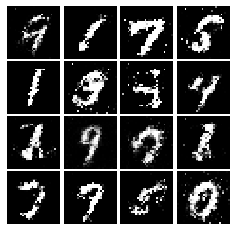

Epoch: 9, Iter: 4340, D: 0.2348, G:0.1692


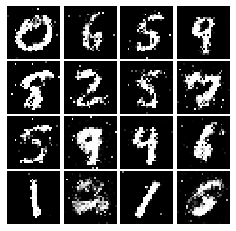

Epoch: 9, Iter: 4360, D: 0.2413, G:0.1563


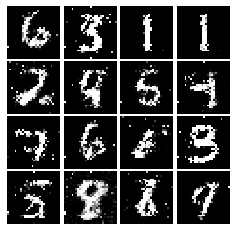

Epoch: 9, Iter: 4380, D: 0.229, G:0.1664


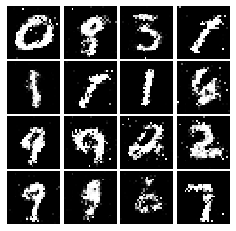

Epoch: 9, Iter: 4400, D: 0.2225, G:0.177


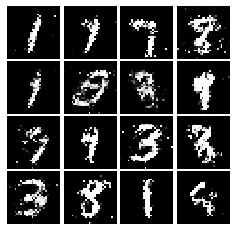

Epoch: 9, Iter: 4420, D: 0.2161, G:0.1709


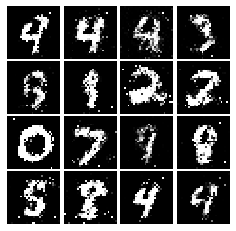

Epoch: 9, Iter: 4440, D: 0.234, G:0.1339


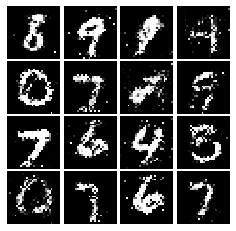

Epoch: 9, Iter: 4460, D: 0.2354, G:0.1779


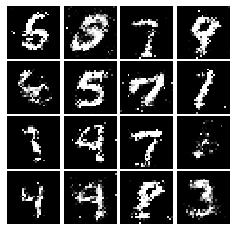

Epoch: 9, Iter: 4480, D: 0.2166, G:0.1671


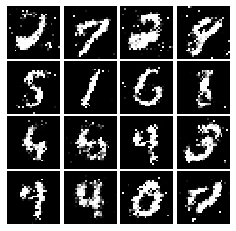

Epoch: 9, Iter: 4500, D: 0.2612, G:0.1731


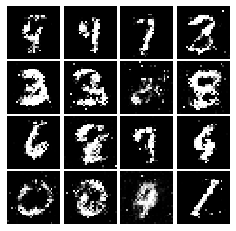

Epoch: 9, Iter: 4520, D: 0.2554, G:0.1633


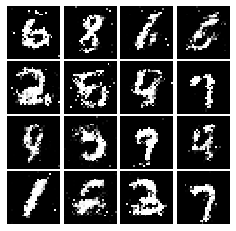

Epoch: 9, Iter: 4540, D: 0.2386, G:0.1756


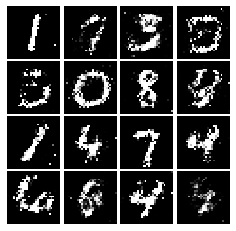

Epoch: 9, Iter: 4560, D: 0.2486, G:0.1708


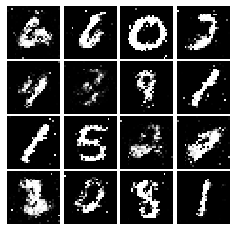

Epoch: 9, Iter: 4580, D: 0.2321, G:0.1748


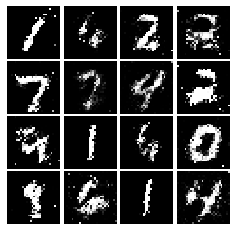

Epoch: 9, Iter: 4600, D: 0.2395, G:0.1683


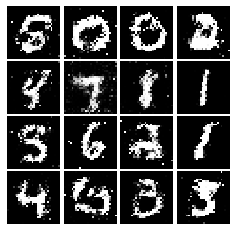

Epoch: 9, Iter: 4620, D: 0.2262, G:0.1589


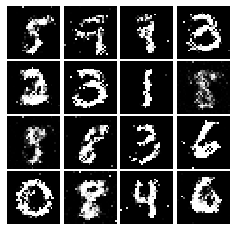

Epoch: 9, Iter: 4640, D: 0.2488, G:0.1633


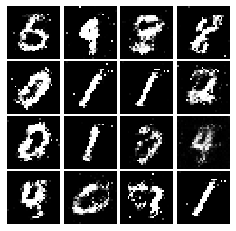

Epoch: 9, Iter: 4660, D: 0.2131, G:0.2016


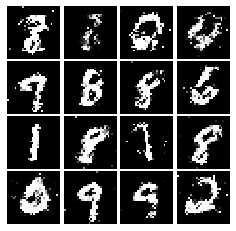

Epoch: 9, Iter: 4680, D: 0.2511, G:0.1393


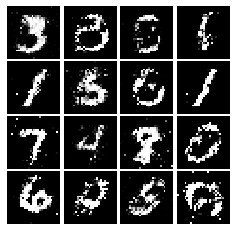

Final images


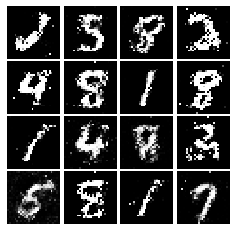

In [64]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [78]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(filters=32, kernel_size=(5,5), strides=1, padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2),
        tf.keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=1, padding='valid'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(pool_size=(2,2), strides=2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [79]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(64, kernel_size=(4,4), strides=2, padding='same', activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, kernel_size=(4,4), strides=2, padding='same', activation='tanh')
    ])
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.445, G:0.6554


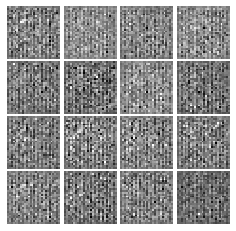

Epoch: 0, Iter: 20, D: 0.8907, G:1.72


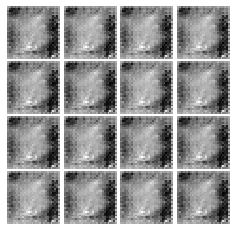

Epoch: 0, Iter: 40, D: 0.1251, G:2.56


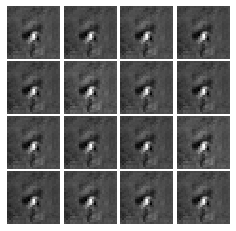

Epoch: 0, Iter: 60, D: 0.6323, G:4.948


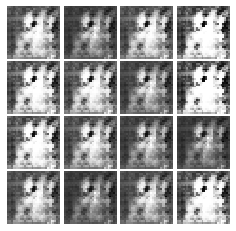

Epoch: 0, Iter: 80, D: 0.6874, G:3.423


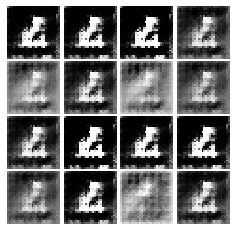

Epoch: 0, Iter: 100, D: 0.4261, G:4.668


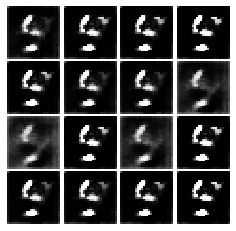

Epoch: 0, Iter: 120, D: 0.2889, G:3.984


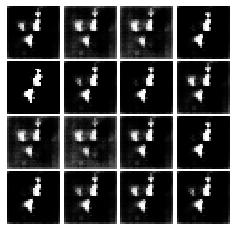

Epoch: 0, Iter: 140, D: 0.7795, G:2.033


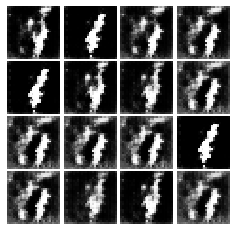

Epoch: 0, Iter: 160, D: 0.2398, G:4.083


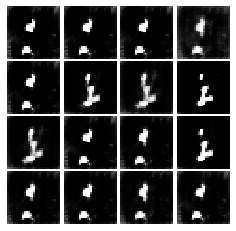

Epoch: 0, Iter: 180, D: 0.6264, G:2.003


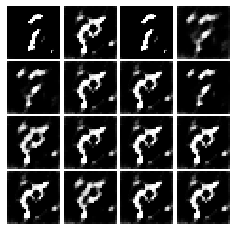

Epoch: 0, Iter: 200, D: 1.613, G:6.895


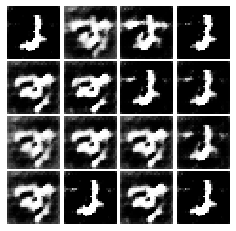

Epoch: 0, Iter: 220, D: 0.6123, G:1.463


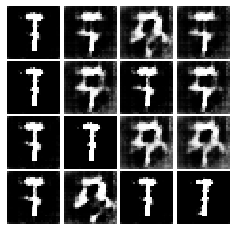

Epoch: 0, Iter: 240, D: 0.3293, G:2.598


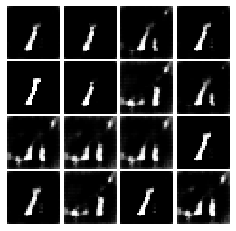

Epoch: 0, Iter: 260, D: 3.47, G:2.939


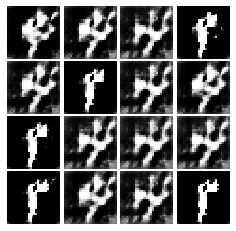

Epoch: 0, Iter: 280, D: 0.3541, G:2.862


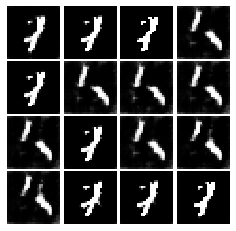

Epoch: 0, Iter: 300, D: 0.2476, G:3.687


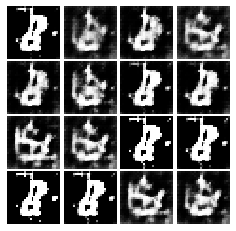

Epoch: 0, Iter: 320, D: 0.1283, G:4.049


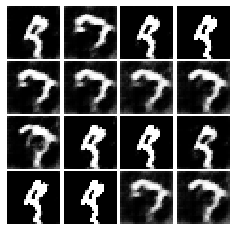

Epoch: 0, Iter: 340, D: 0.647, G:2.455


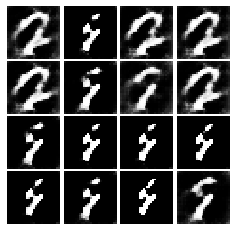

Epoch: 0, Iter: 360, D: 1.058, G:7.464


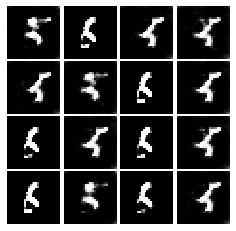

Epoch: 0, Iter: 380, D: 0.6681, G:3.873


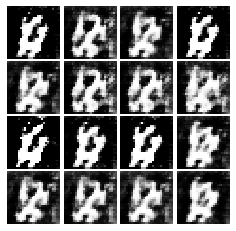

Epoch: 0, Iter: 400, D: 1.075, G:4.41


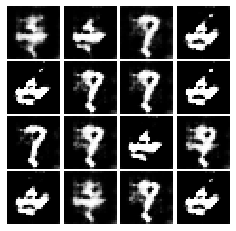

Epoch: 0, Iter: 420, D: 0.2274, G:3.627


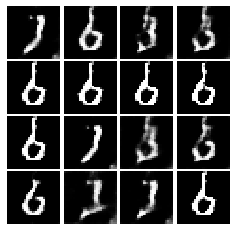

Epoch: 0, Iter: 440, D: 0.36, G:5.049


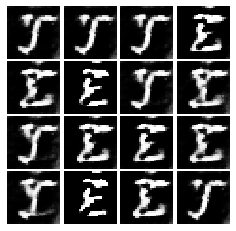

Epoch: 0, Iter: 460, D: 0.1879, G:3.982


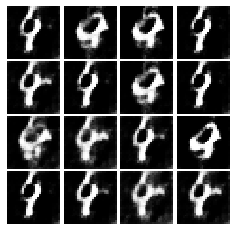

Epoch: 1, Iter: 480, D: 0.4687, G:2.599


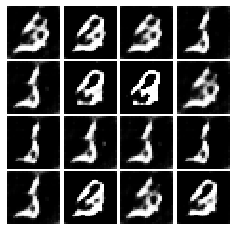

Epoch: 1, Iter: 500, D: 0.6636, G:4.145


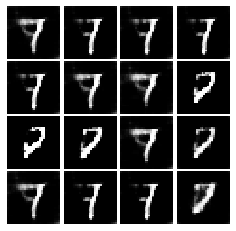

Epoch: 1, Iter: 520, D: 0.6387, G:0.6111


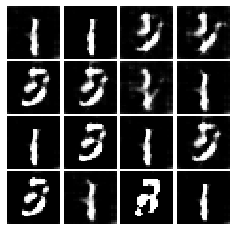

Epoch: 1, Iter: 540, D: 0.5765, G:2.505


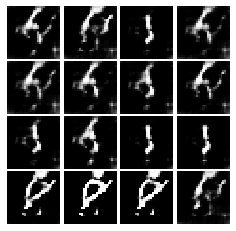

Epoch: 1, Iter: 560, D: 0.4492, G:2.71


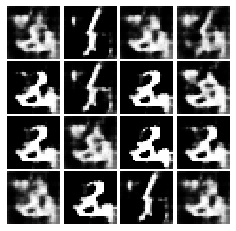

Epoch: 1, Iter: 580, D: 0.4605, G:2.196


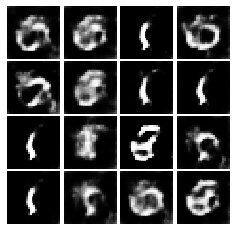

Epoch: 1, Iter: 600, D: 0.5061, G:2.642


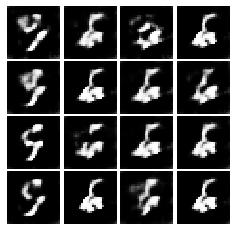

Epoch: 1, Iter: 620, D: 0.4729, G:2.315


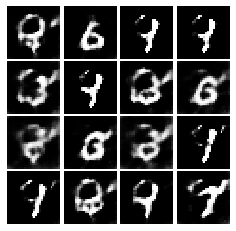

Epoch: 1, Iter: 640, D: 0.4638, G:3.624


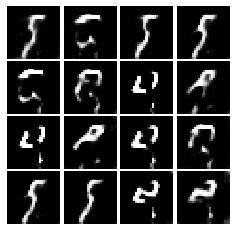

Epoch: 1, Iter: 660, D: 0.4175, G:2.974


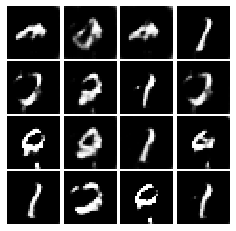

Epoch: 1, Iter: 680, D: 0.3325, G:3.865


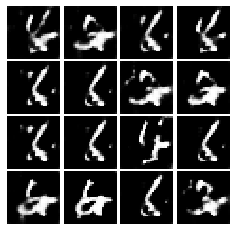

Epoch: 1, Iter: 700, D: 3.298, G:2.228


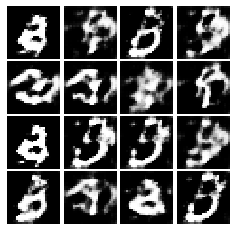

Epoch: 1, Iter: 720, D: 0.5726, G:4.46


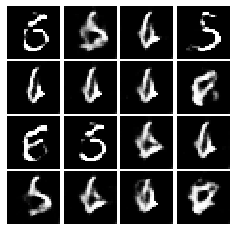

Epoch: 1, Iter: 740, D: 0.5739, G:2.542


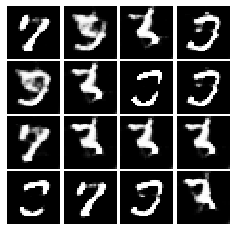

Epoch: 1, Iter: 760, D: 0.4011, G:3.537


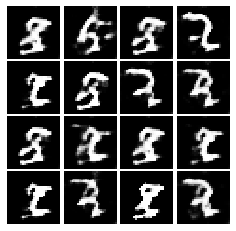

Epoch: 1, Iter: 780, D: 0.7394, G:3.646


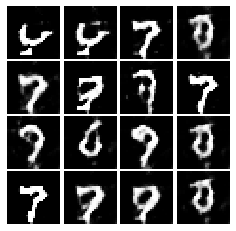

Epoch: 1, Iter: 800, D: 0.4934, G:3.957


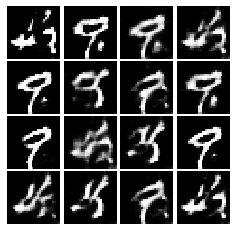

Epoch: 1, Iter: 820, D: 0.6476, G:2.048


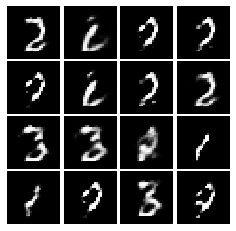

Epoch: 1, Iter: 840, D: 0.5514, G:1.896


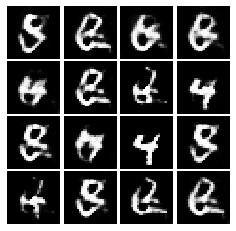

Epoch: 1, Iter: 860, D: 0.5419, G:3.187


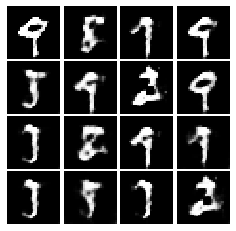

Epoch: 1, Iter: 880, D: 0.2597, G:3.216


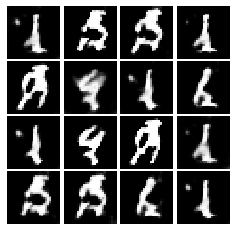

Epoch: 1, Iter: 900, D: 0.1998, G:3.337


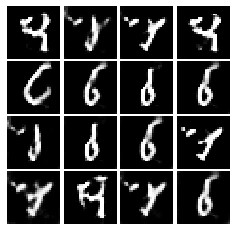

Epoch: 1, Iter: 920, D: 0.9194, G:2.729


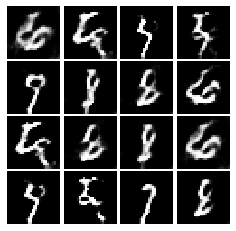

Epoch: 2, Iter: 940, D: 0.6986, G:5.026


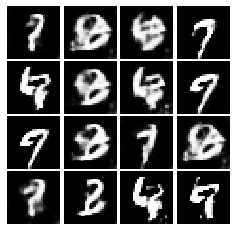

Epoch: 2, Iter: 960, D: 1.4, G:2.698


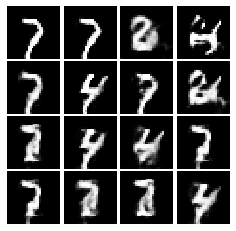

Epoch: 2, Iter: 980, D: 0.4056, G:2.481


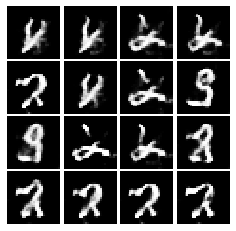

Epoch: 2, Iter: 1000, D: 0.3097, G:3.336


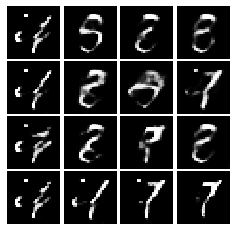

Epoch: 2, Iter: 1020, D: 0.3863, G:2.785


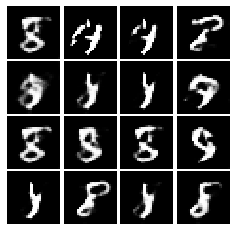

Epoch: 2, Iter: 1040, D: 0.6158, G:4.859


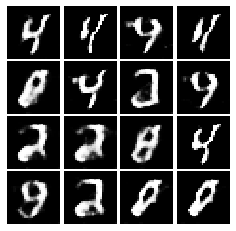

Epoch: 2, Iter: 1060, D: 0.2225, G:3.664


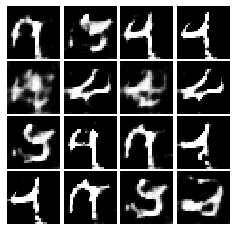

Epoch: 2, Iter: 1080, D: 0.4026, G:1.721


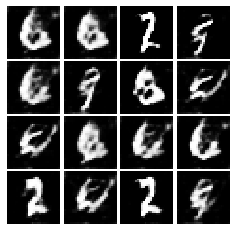

Epoch: 2, Iter: 1100, D: 0.5506, G:4.889


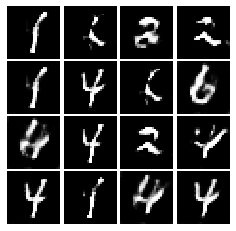

Epoch: 2, Iter: 1120, D: 0.4426, G:2.432


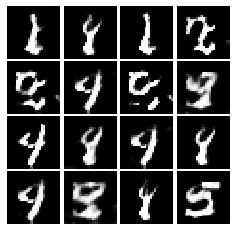

Epoch: 2, Iter: 1140, D: 0.5685, G:5.377


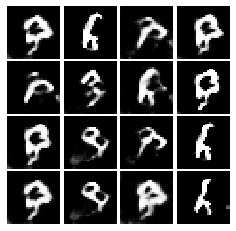

Epoch: 2, Iter: 1160, D: 0.6447, G:2.376


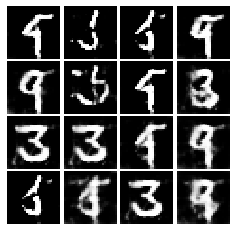

Epoch: 2, Iter: 1180, D: 0.4389, G:2.989


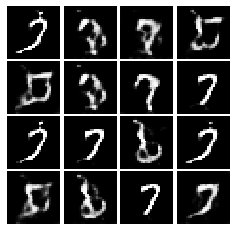

Epoch: 2, Iter: 1200, D: 0.1533, G:3.227


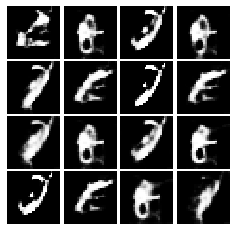

Epoch: 2, Iter: 1220, D: 0.4493, G:2.999


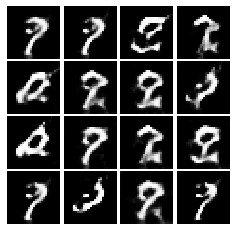

Epoch: 2, Iter: 1240, D: 0.3168, G:2.839


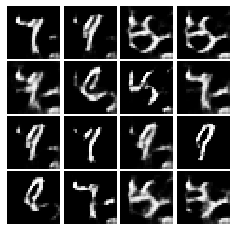

Epoch: 2, Iter: 1260, D: 1.145, G:1.701


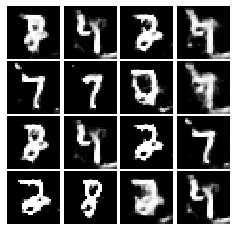

Epoch: 2, Iter: 1280, D: 0.4568, G:3.585


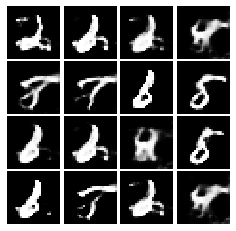

Epoch: 2, Iter: 1300, D: 0.3149, G:2.999


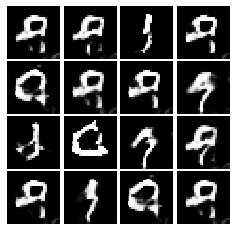

Epoch: 2, Iter: 1320, D: 0.257, G:3.522


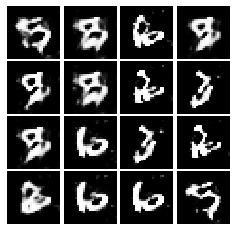

Epoch: 2, Iter: 1340, D: 0.2169, G:4.949


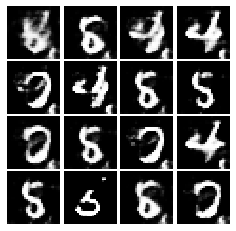

Epoch: 2, Iter: 1360, D: 0.2983, G:3.105


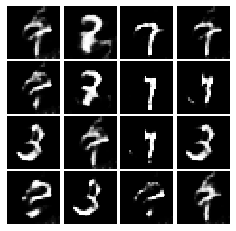

Epoch: 2, Iter: 1380, D: 0.2547, G:3.734


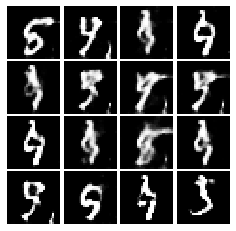

Epoch: 2, Iter: 1400, D: 0.4779, G:3.519


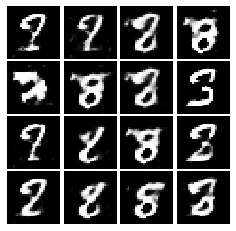

Final images


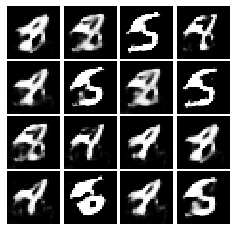

5882.341547250748


In [83]:
import time
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
start = time.time()
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=3)
end = time.time()
print(end-start)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:

minimax evaluates to the same values like in the beginning
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2    |   1    |   -1    |   -2    |   -1    |  1     
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   -1   |   -2    |  -1     |   1    |    2   |  1   
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

No, because by increasing y we decrease x which decrese y which then increse x... This comes in circles and we wont reach an optimal value.

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
